## ENCM 509 Final Project (Face Detection and Recognition using OpenCV)
## Group 7
## Members: Ahmed Anwar, Ali Mekawy, Mohamed Mahmoud

In [1]:
import cv2
import matplotlib.pyplot as plt
from skimage.feature import local_binary_pattern
from sklearn.svm import SVC
import numpy as np
from sklearn.utils import shuffle
import os
from sklearn.model_selection import train_test_split
from sklearn.neural_network import MLPClassifier
import shutil
from sklearn.metrics import roc_curve, det_curve
from glob import glob
from sklearn.metrics import confusion_matrix
import seaborn as sns
import pandas as pd
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import tensorflow as tf

## Visualizing the dataset

Found 40 classes: ['s1', 's10', 's11', 's12', 's13', 's14', 's15', 's16', 's17', 's18', 's19', 's2', 's20', 's21', 's22', 's23', 's24', 's25', 's26', 's27', 's28', 's29', 's3', 's30', 's31', 's32', 's33', 's34', 's35', 's36', 's37', 's38', 's39', 's4', 's40', 's5', 's6', 's7', 's8', 's9']


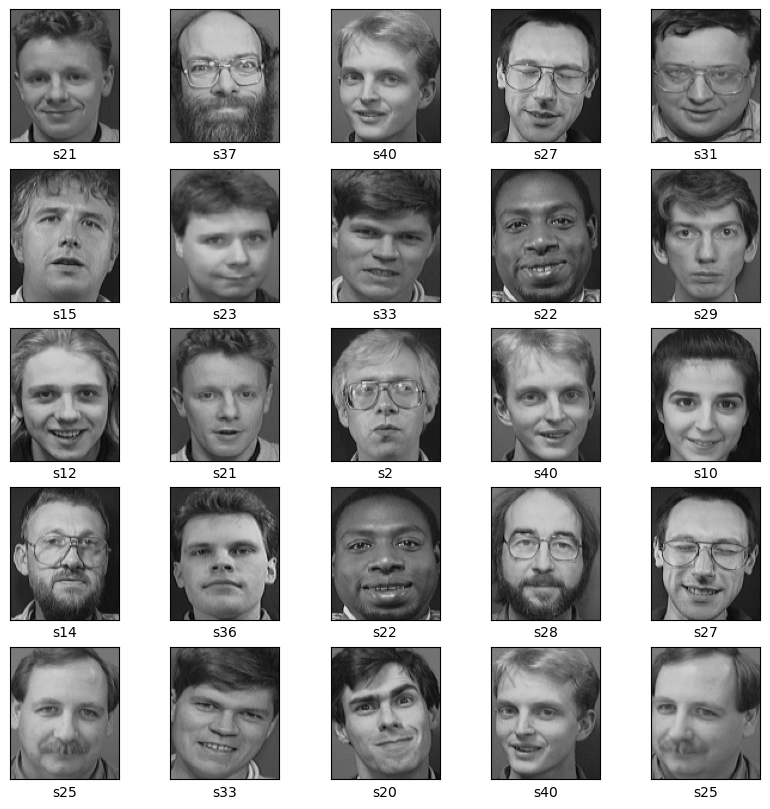

In [19]:
DATASET_PATH = 'ATT_dataset'

if not os.path.exists(DATASET_PATH):
    print('Dataset not found!')
    exit(1)

# Load dataset
classes = os.listdir(DATASET_PATH)
print('Found {} classes: {}'.format(len(classes), classes))

# Visualizing the images
images = []
labels = []
class_index = 0
for class_name in classes:
    class_path = os.path.join(DATASET_PATH, class_name)
    for image_name in os.listdir(class_path):
        image_path = os.path.join(class_path, image_name)
        image = cv2.imread(image_path)
        images.append(image)
        labels.append(class_index)
    class_index += 1
images = np.array(images)
labels = np.array(labels)

# Shuffle the dataset with scikit-learn
images, labels = shuffle(images, labels, random_state=0)

# Plot 25 random images from the dataset
plt.figure(figsize=(10, 10))
for i in range(25):
    plt.subplot(5, 5, i + 1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(images[i])
    plt.xlabel(classes[labels[i]])


# Splitting into training and testing datasets (5-fold cross validation)

In [215]:
# Define source directory and target directories
src_dir = 'ATT_dataset'

# Number of folds
num_folds = 5

# Create target directories if they don't exist
for i in range(1, num_folds+1):
    os.makedirs(f'train_dataset_{i}', exist_ok=True)
    os.makedirs(f'test_dataset_{i}', exist_ok=True)

# Get list of all subdirectories
subdirs = [d for d in os.listdir(src_dir) if os.path.isdir(os.path.join(src_dir, d))]

# Loop over each subdirectory
for subdir in subdirs:
    subdir_path = os.path.join(src_dir, subdir)
    images = os.listdir(subdir_path)
    
    # Shuffle the list of images
    np.random.shuffle(images)
    
    # Split the list of images into 5 folds
    images_folds = np.array_split(images, num_folds)

    # For each fold, assign it as testing set and the rest as training set
    for i in range(num_folds):
        train_images = np.concatenate([images_folds[j] for j in range(num_folds) if j != i]).tolist()
        test_images = images_folds[i].tolist()

        # Create corresponding subdirectories in the target directories
        os.makedirs(os.path.join(f'train_dataset_{i+1}', subdir), exist_ok=True)
        os.makedirs(os.path.join(f'test_dataset_{i+1}', subdir), exist_ok=True)
        
        # Copy the training images to the training directory
        for image in train_images:
            shutil.copy(os.path.join(subdir_path, image), os.path.join(f'train_dataset_{i+1}', subdir, image))
        
        # Copy the testing images to the testing directory
        for image in test_images:
            shutil.copy(os.path.join(subdir_path, image), os.path.join(f'test_dataset_{i+1}', subdir, image))

## Face detection visualization

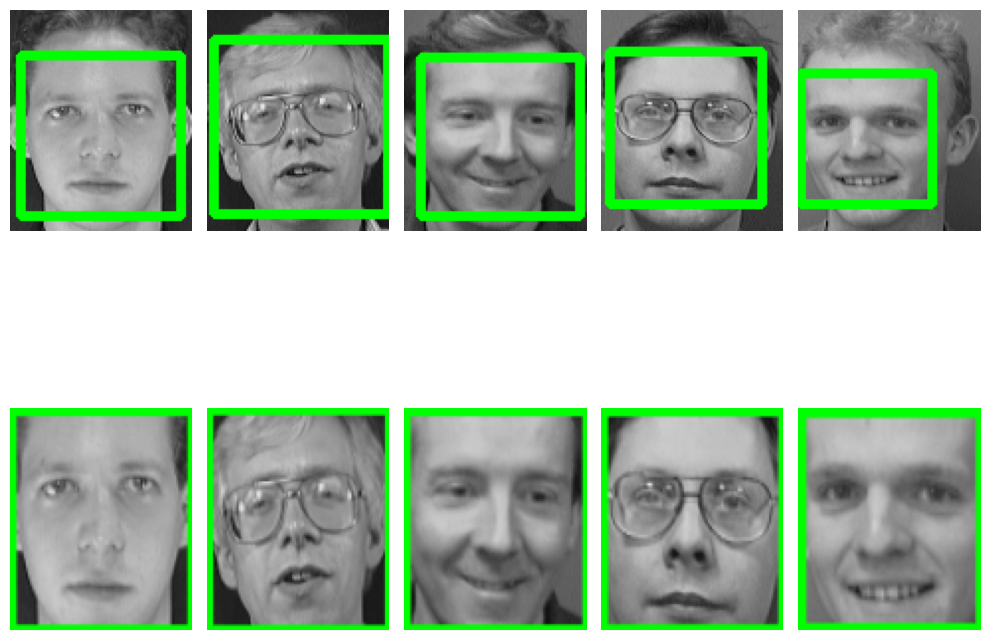

In [216]:
# Perform face detection on a few different subjects

# Load the images
images = []
cropped_faces = []
for i in range(1, 6):
    path = 'ATT_dataset/s{}/1.pgm'.format(i)
    img = cv2.imread(path)
    images.append(img)

# Perform face detection
face_cascade = cv2.CascadeClassifier('haarcascade_frontalface_default.xml')
for i in range(5):
    gray = cv2.cvtColor(images[i], cv2.COLOR_BGR2GRAY)
    face_box = face_cascade.detectMultiScale(gray, scaleFactor=1.1, minNeighbors=4)
    for (x, y, w, h) in face_box:
        cv2.rectangle(images[i], (x, y), (x+w, y+h), (0, 255, 0), 3)
        cropped_faces.append(images[i][y:y+h, x:x+w])
        cropped_faces[-1] = cv2.resize(cropped_faces[-1], (92, 112))

plt.figure(figsize=(10, 10))
for i in range(5):
    plt.subplot(2, 5, i + 1)
    plt.imshow(images[i])
    plt.axis('off')
    plt.subplot(2, 5, i + 6)
    
    plt.imshow(cropped_faces[i], cmap='gray')
    plt.axis('off')

plt.tight_layout()


## LBP feature extraction visualization

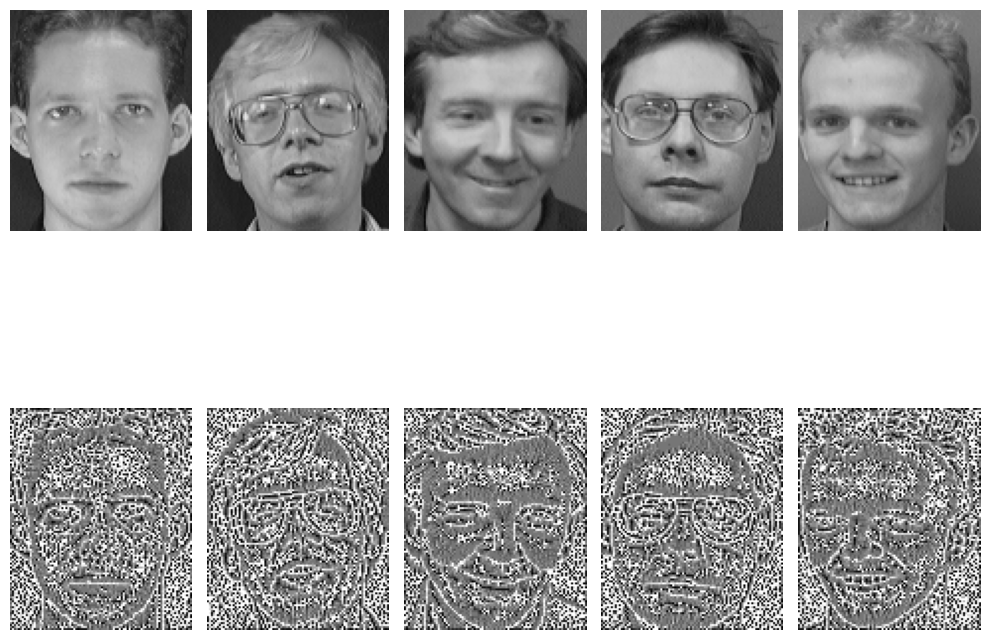

In [217]:
# Load the images
images = []
for i in range(1, 6):
    path = 'ATT_dataset/s{}/1.pgm'.format(i)
    img = cv2.imread(path)
    images.append(img)
    
# Perform LBP feature extraction
lbp_images = []
for img in images:
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    lbp = local_binary_pattern(gray, 12, 1, 'uniform')
    lbp_images.append(lbp)

# Display the images
plt.figure(figsize=(10, 10))
for i in range(5):
    plt.subplot(2, 5, i + 1)
    plt.imshow(images[i])
    plt.axis('off')
    plt.subplot(2, 5, i + 6)
    plt.imshow(lbp_images[i], cmap='gray')
    plt.axis('off')

plt.tight_layout()





In [218]:
from skimage import feature

def get_data(path):
    
    paths = glob(path, recursive=True)
    data = []
    label = []

    for path in paths:
        img = cv2.imread(path, 0)
        subject_label = path[path.rfind('s')+1:path.rfind('\\')]

        img = cv2.resize(img, (1, len(img)* len(img[0])))
        img = np.float32(np.array(img) / 255.0)

        # LBP feature extraction
        lbp = feature.local_binary_pattern(img, 8, 3, method="uniform")
        (hist, _) = np.histogram(lbp.ravel(), bins=np.arange(0, 12), range=(0, 11))

        # normalize the histogram
        hist = hist.astype("float")
        # hist /= (hist.sum() + 1e-7)

        data.append(hist)
        label.append(int(subject_label))

    return np.array(data), np.array(label)

In [220]:
train_path = r'train_dataset_1\\**\\*.pgm'
test_path = r'test_dataset_1\\**\\*.pgm'

train_data, train_label = get_data(train_path)
test_data, test_label = get_data(test_path)

svm = SVC(C= 0.1, gamma = 0.01, kernel='linear' , probability=True)
svm.fit(train_data, train_label)

# probability matrix NxM where N is number of samples and M is the number of classes
probability_matrix_svm_1 = svm.predict_proba(test_data)

# Make prediction
prediction_svm_1 = svm.predict(test_data)

# Calculate accuracy
accuracy_svm = svm.score(test_data, test_label)
print('SVM accuracy: {:.2f}%'.format(accuracy_svm * 100))

c:\Users\alime\anaconda3\Lib\site-packages\skimage\feature\texture.py:353: UserWarning: Applying `local_binary_pattern` to floating-point images may give unexpected results when small numerical differences between adjacent pixels are present. It is recommended to use this function with images of integer dtype.
  warnings.warn(


KeyboardInterrupt: 

In [188]:
train_data, train_label = get_data(train_path)
test_data, test_label = get_data(test_path)

mlp = MLPClassifier(hidden_layer_sizes=(128, 64, 128), learning_rate_init=0.001, random_state= 1, max_iter = 200, activation='relu')

mlp.fit(train_data, train_label)

probability_matrix_mlp_1 = mlp.predict_proba(test_data)

prediction_mlp_1 = mlp.predict(test_data)
accuracy = np.mean(prediction_mlp_1 == test_label)
print('MLP accuracy: {:.2f}%'.format(accuracy * 100))

c:\Users\alime\anaconda3\Lib\site-packages\skimage\feature\texture.py:353: UserWarning: Applying `local_binary_pattern` to floating-point images may give unexpected results when small numerical differences between adjacent pixels are present. It is recommended to use this function with images of integer dtype.
  warnings.warn(


MLP accuracy: 5.83%


## Images loading and preprocessing

In [221]:
def get_data(path):
    
    paths = glob(path, recursive=True)
    data = []
    label = []

    for path in paths:
        img = cv2.imread(path, 0)
        subject_label = path[path.rfind('s')+1:path.rfind('\\')]

        img = cv2.resize(img, (1, len(img)* len(img[0])))
        img = np.float32(np.array(img) / 255.0)

        data.append(img)
        label.append(int(subject_label))

    return np.array(data)[:,:,0], np.array(label)

## TEST CODE IN BOX BELOW!

In [126]:
## test code
from skimage import img_as_ubyte

def get_data(path):
    
    paths = glob(path, recursive=True)
    data = []
    label = []

    for path in paths:
        img = cv2.imread(path, 0)
        subject_label = path[path.rfind('s')+1:path.rfind('\\')]

        face_cascade = cv2.CascadeClassifier('haarcascade_frontalface_default.xml')
        
        face_box = face_cascade.detectMultiScale(img, scaleFactor=1.0001, minNeighbors=9)

        for (x, y, w, h) in face_box:
            cv2.rectangle(img, (x, y), (x+w, y+h), (0, 255, 0), 3)
        
        face = img[y:y+h, x:x+w]


        # resize to original size
        face = cv2.resize(face, (92, 112))

        face = cv2.resize(face, (1, len(face)* len(face[0])))
        face = np.float32(np.array(face) / 255.0)

        # do lbp featyre excraction
        # lbp = local_binary_pattern(img, 12, 3)
        # (hist, _) = np.histogram(lbp.ravel(), bins=np.arange(0, 8 + 3), range=(0, 8 + 2))
        

        # visualise image
        # plt.imshow(img, cmap='gray')

        # img = img_as_ubyte(img)

        # lbp = local_binary_pattern(img, 12, 3, method='default')
        # (hist, _) = np.histogram(lbp.ravel(), density= 'True', bins=np.arange(0, 8 + 3), range=(0, 8 + 2))

        # Normalize the images


        data.append(face)
        label.append(int(subject_label))

    return np.array(data)[:,:,0], np.array(label)

In [235]:
# function to plot the predictions

def plot_predictions(predictions):

    test_path = r'test_dataset_2\\**\\*.pgm'

    test_data, test_label = get_data(test_path)

    # display faces and predicted vs actual labels

    DATASET_PATH = 'test_dataset'

    # Load the images
    images = []
    labels = []
    class_index = 0
    for class_name in classes:
        class_path = os.path.join('test_dataset_1', class_name)
        for image_name in os.listdir(class_path):
            image_path = os.path.join(class_path, image_name)
            image = cv2.imread(image_path)
            images.append(image)
            labels.append(class_index)
        class_index += 1
    images = np.array(images)
    labels = np.array(labels)

    # shuffle the dataset and labels and predictions in the same order
    # Generate a permutation of indices
    indices = np.arange(len(images))
    np.random.shuffle(indices)

    # Use the permutation to index into each array
    images = images[indices]
    test_label = test_label[indices]
    predictions = predictions[indices]


    plt.figure(figsize=(10, 10))
    for i in range(20):
        plt.subplot(4, 5, i + 1)  # 4 rows, 5 columns, subplot index from 1 to 20
        plt.imshow(images[i], cmap='gray')
        plt.axis('off')
        plt.title('Actual: {} \n Predicted: {}'.format(test_label[i], predictions[i]))

    plt.tight_layout()

In [278]:
def SVM_model(c_param, gamma_param, kernel_param):

    train_paths = [f'train_dataset_{i+1}\\**\\*.pgm' for i in range(5)]
    test_paths = [f'test_dataset_{i+1}\\**\\*.pgm' for i in range(5)]

    accuracies = []

    prediction_svm = 0
    probability_matrix_svm = 0
    max_accuracy = 0

    for i in range(5):
        train_data, train_label = get_data(train_paths[i])
        test_data, test_label = get_data(test_paths[i])

        svm = SVC(C = c_param, gamma = gamma_param, kernel = kernel_param, probability=True)
        svm.fit(train_data, train_label)

        # probability matrix NxM where N is number of samples and M is the number of classes
        probability_matrix_svm = svm.predict_proba(test_data)

        # Make prediction
        prediction_svm = svm.predict(test_data)

        # Calculate accuracy
        accuracy_svm = svm.score(test_data, test_label)

        if accuracy_svm > max_accuracy:
            max_accuracy = accuracy_svm
            probability_matrix_svm = probability_matrix_svm
            prediction_svm = prediction_svm

        accuracies.append(accuracy_svm)

        print('SVM accuracy fold {}: {:.2f}%'.format(i+1, accuracy_svm * 100))

    print('Average accuracy: {:.2f}%'.format(np.mean(accuracies) * 100))

    plot_predictions(prediction_svm)

    return probability_matrix_svm, prediction_svm

## SVM C = 0.1, gamma = 0.001, kernel = linear

SVM accuracy fold 1: 80.00%
SVM accuracy fold 2: 83.75%
SVM accuracy fold 3: 81.25%
SVM accuracy fold 4: 76.25%
SVM accuracy fold 5: 77.50%
Average accuracy: 79.75%


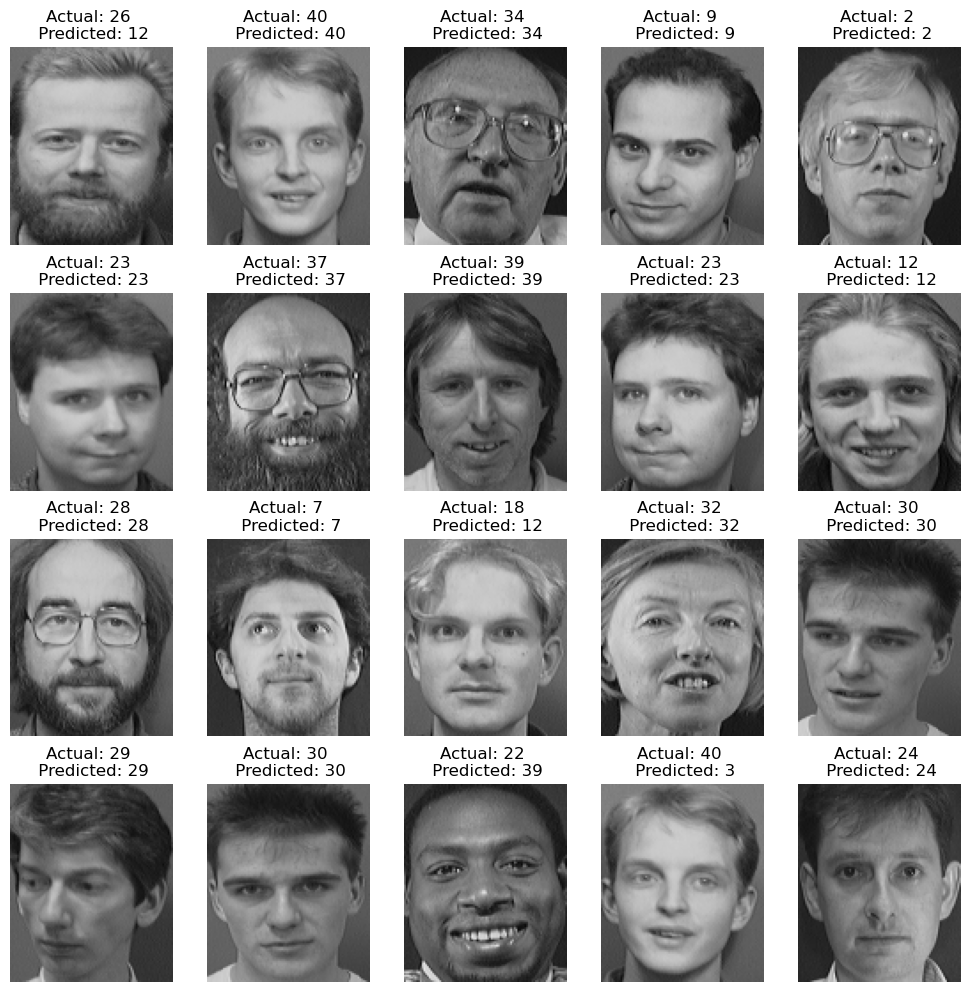

In [279]:
probability_matrix_svm_1, prediction_svm_1 = SVM_model(0.1, 0.001, 'linear')

## SVM C = 0.2, gamma = 0.001, kernel = linear

SVM accuracy fold 1: 80.00%
SVM accuracy fold 2: 83.75%
SVM accuracy fold 3: 81.25%
SVM accuracy fold 4: 76.25%
SVM accuracy fold 5: 77.50%
Average accuracy: 79.75%


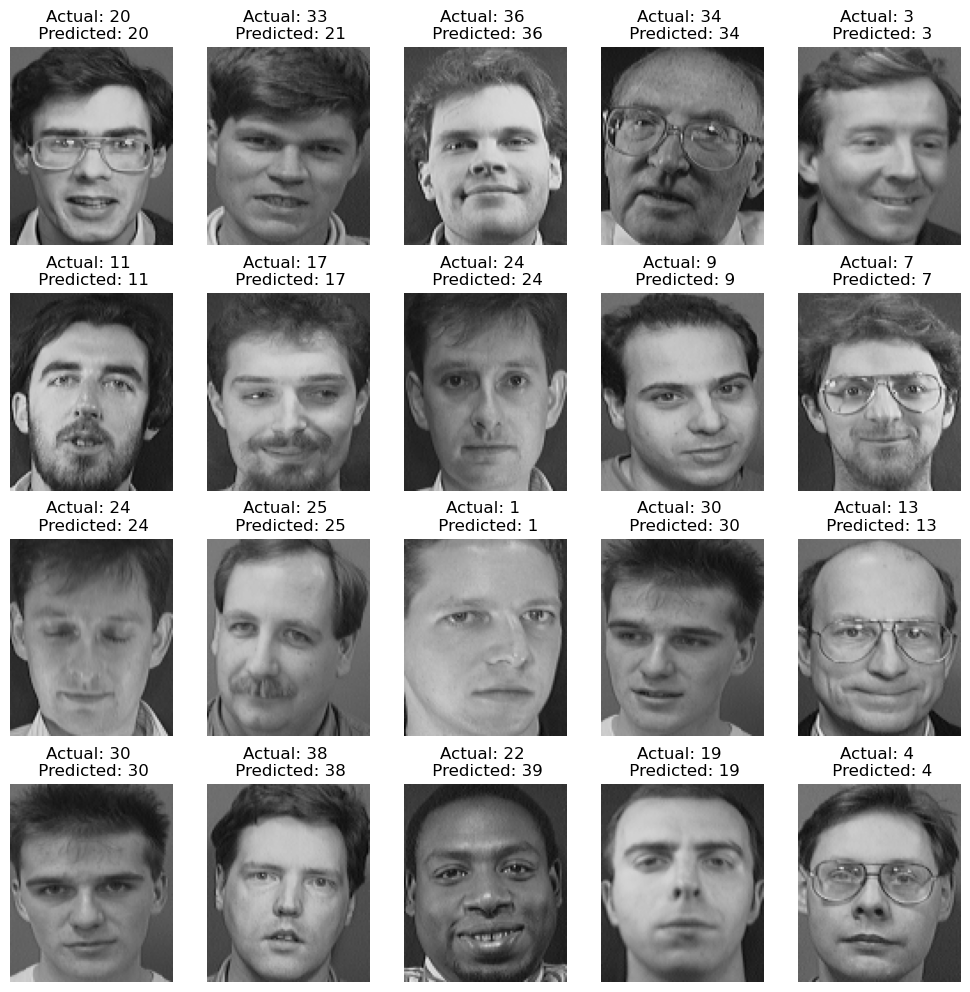

In [283]:
probability_matrix_svm_2, prediction_svm_2 = SVM_model(0.2, 0.001, 'linear')

## SVM C = 0.05, gamma = 0.001, kernel = linear

SVM accuracy fold 1: 78.75%
SVM accuracy fold 2: 85.00%
SVM accuracy fold 3: 81.25%
SVM accuracy fold 4: 76.25%
SVM accuracy fold 5: 77.50%
Average accuracy: 79.75%


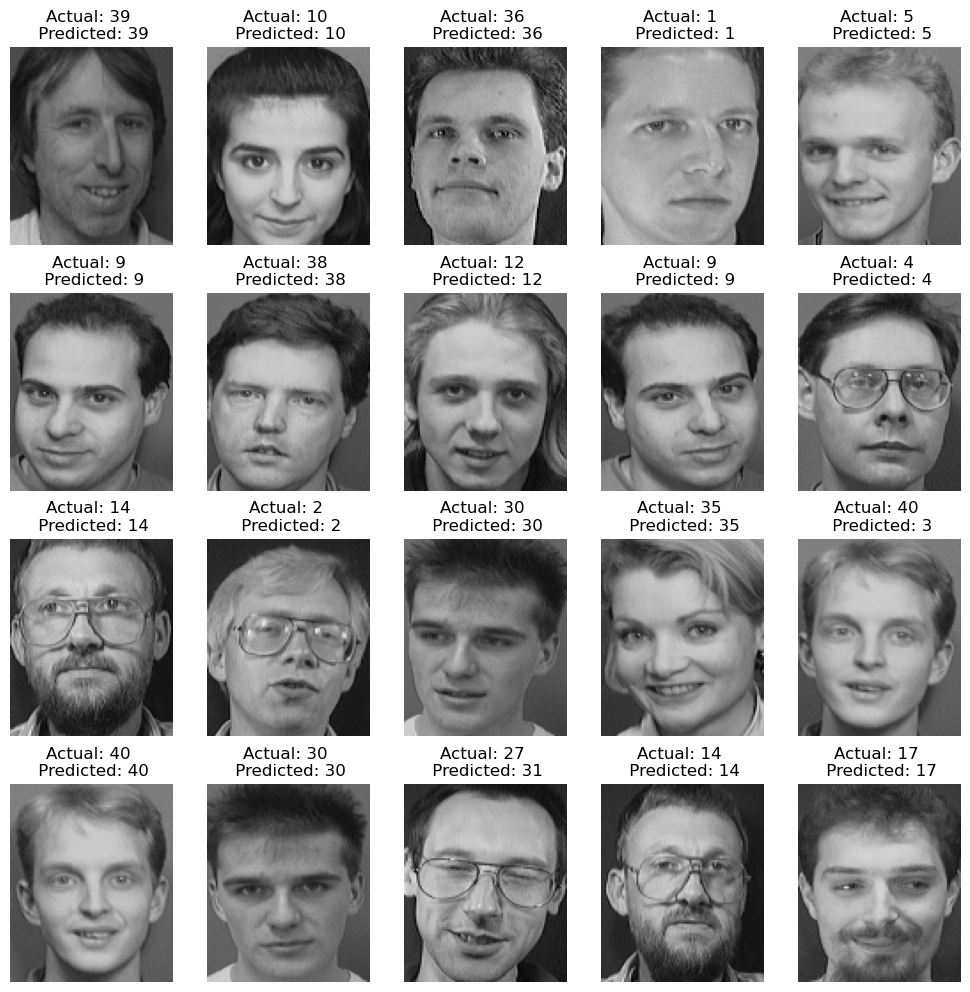

In [284]:
probability_matrix_svm_3, prediction_svm_3 = SVM_model(0.05, 0.001, 'linear')

## SVM C = 0.01, gamma = 0.001, kernel = linear

SVM accuracy fold 1: 77.50%
SVM accuracy fold 2: 82.50%
SVM accuracy fold 3: 81.25%
SVM accuracy fold 4: 71.25%
SVM accuracy fold 5: 71.25%
Average accuracy: 76.75%


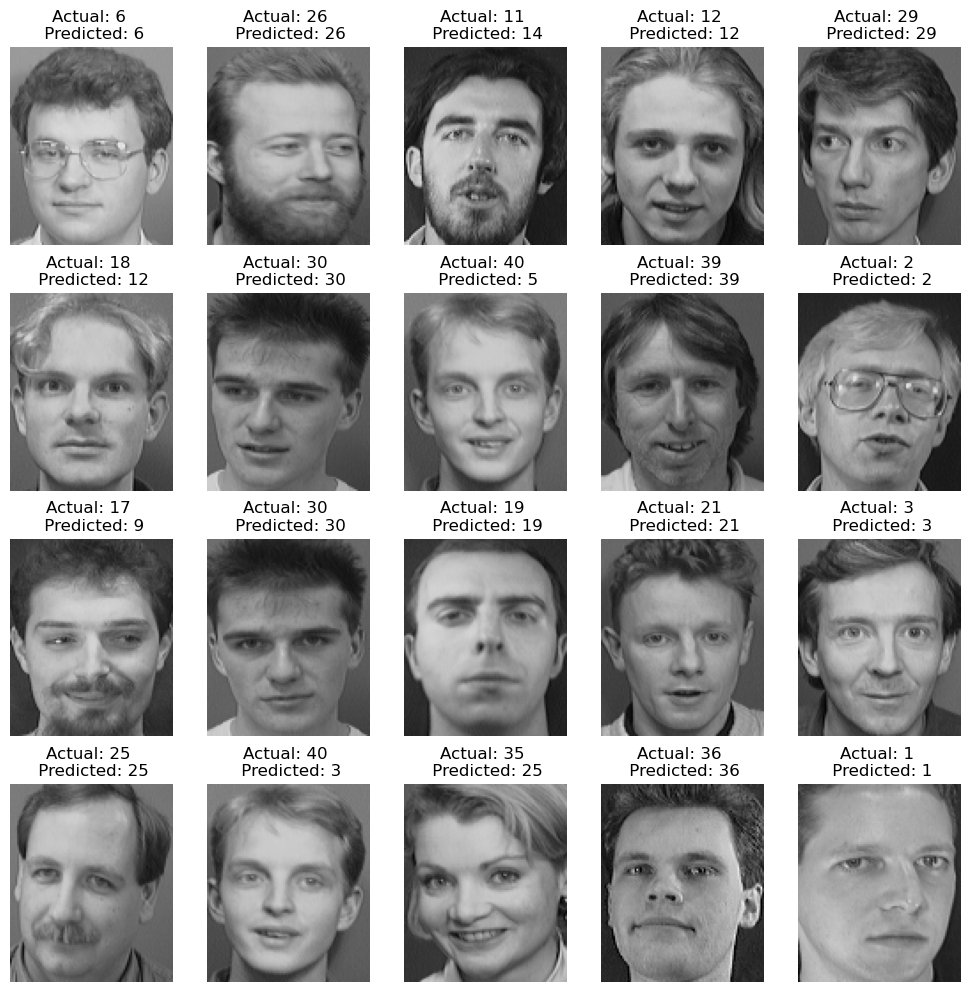

In [285]:
probability_matrix_svm_4, prediction_svm_4 = SVM_model(0.01, 0.001, 'linear')

## SVM C = 0.1, gamma = 0.2, kernel = linear

SVM accuracy fold 1: 80.00%
SVM accuracy fold 2: 83.75%
SVM accuracy fold 3: 81.25%
SVM accuracy fold 4: 76.25%
SVM accuracy fold 5: 77.50%
Average accuracy: 79.75%


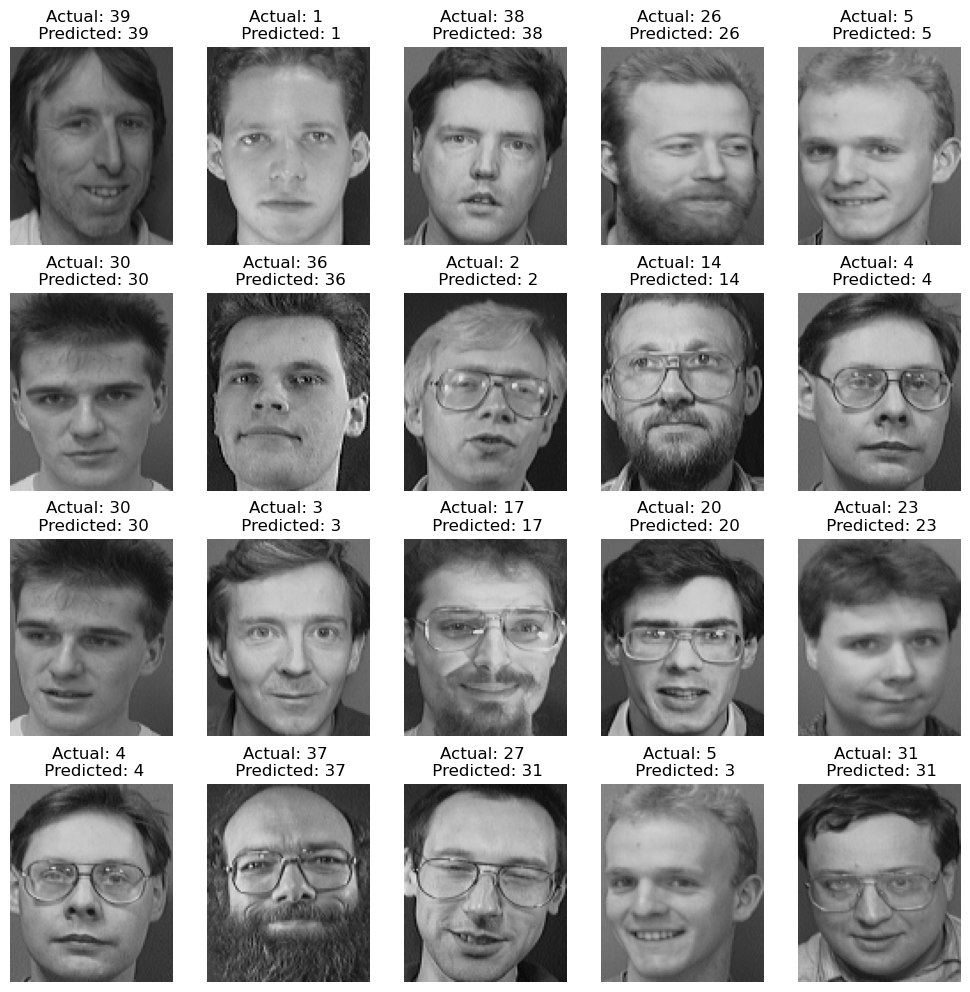

In [286]:
probability_matrix_svm_5, prediction_svm_5 = SVM_model(0.1,0.2, 'linear')

## SVM C = 0.1, gamma = 0.01, kernel = linear

SVM accuracy fold 1: 80.00%
SVM accuracy fold 2: 83.75%
SVM accuracy fold 3: 81.25%
SVM accuracy fold 4: 76.25%
SVM accuracy fold 5: 77.50%
Average accuracy: 79.75%


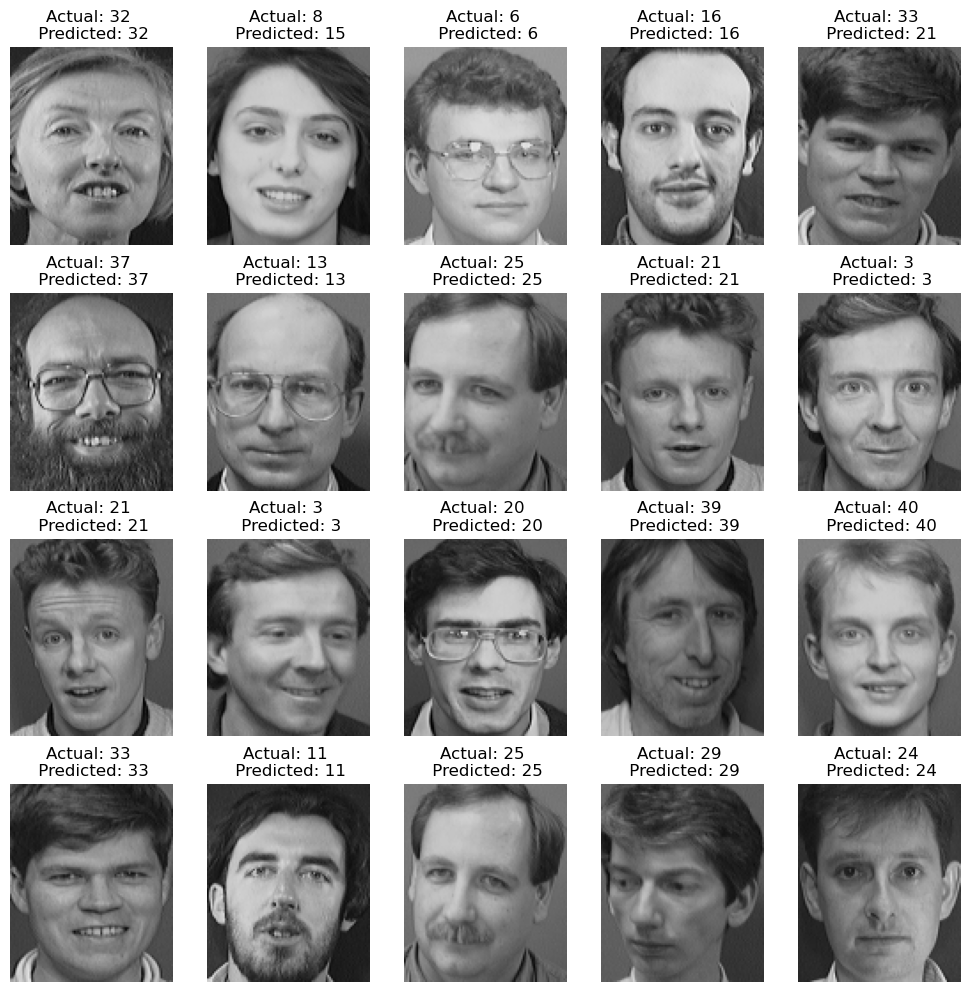

In [287]:
probability_matrix_svm_6, prediction_svm_6 = SVM_model(0.1, 0.01, 'linear')

## SVM C = 0.1, gamma = 0.0001, kernel = linear

SVM accuracy fold 1: 80.00%
SVM accuracy fold 2: 83.75%
SVM accuracy fold 3: 81.25%
SVM accuracy fold 4: 76.25%
SVM accuracy fold 5: 77.50%
Average accuracy: 79.75%


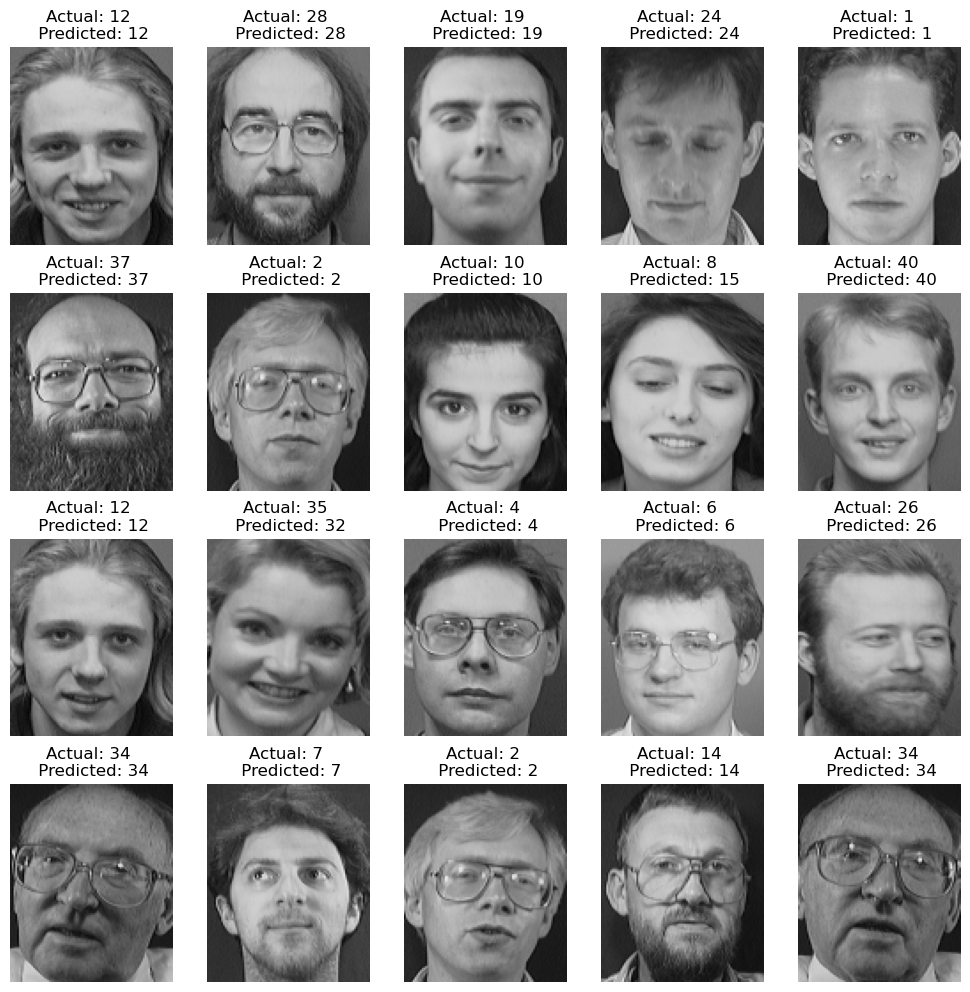

In [288]:
probability_matrix_svm_7, prediction_svm_7 = SVM_model(0.1, 0.0001, 'linear')

## SVM C = 0.1, gamma = 0.001, kernel = linear

SVM accuracy fold 1: 63.75%
SVM accuracy fold 2: 62.50%
SVM accuracy fold 3: 63.75%
SVM accuracy fold 4: 63.75%
SVM accuracy fold 5: 62.50%
Average accuracy: 63.25%


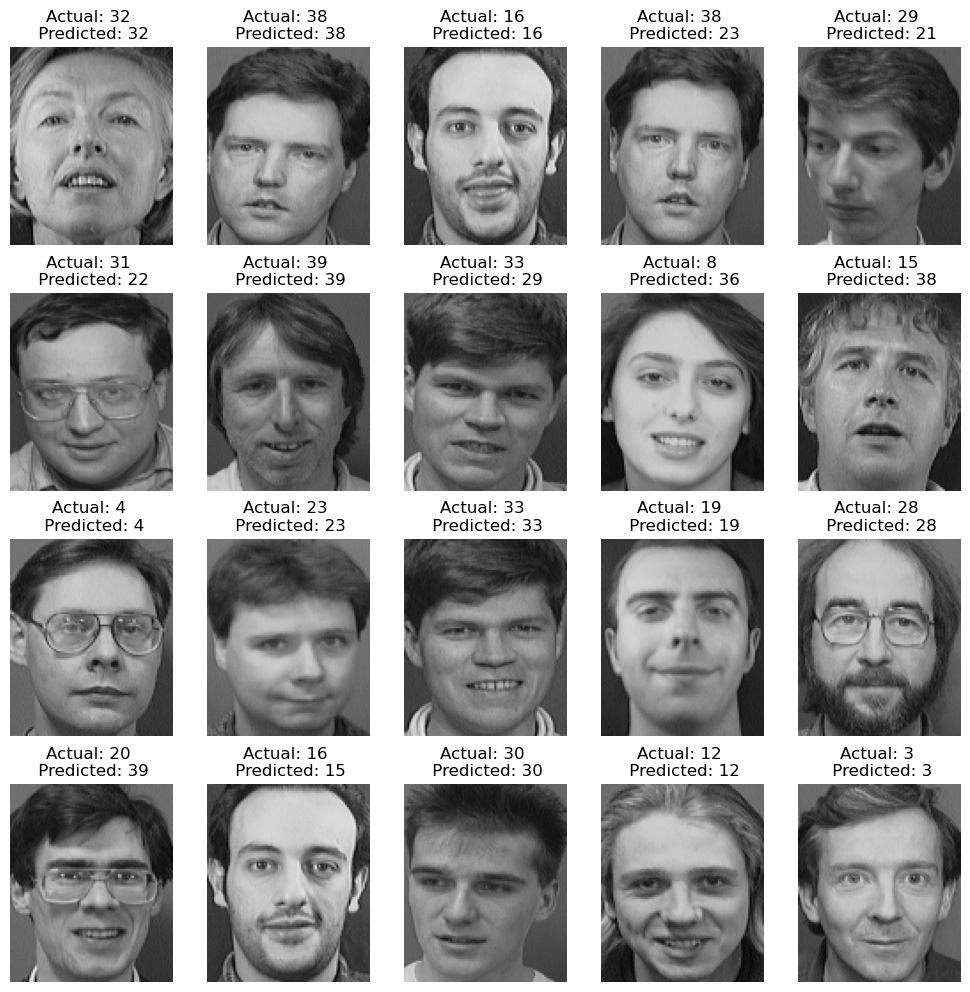

In [289]:
probability_matrix_svm_8, prediction_svm_8 = SVM_model(0.1, 0.001, 'poly')

## SVM C = 0.1, gamma = 0.001, kernel = rbf

SVM accuracy fold 1: 63.75%
SVM accuracy fold 2: 67.50%
SVM accuracy fold 3: 71.25%
SVM accuracy fold 4: 58.75%
SVM accuracy fold 5: 62.50%
Average accuracy: 64.75%


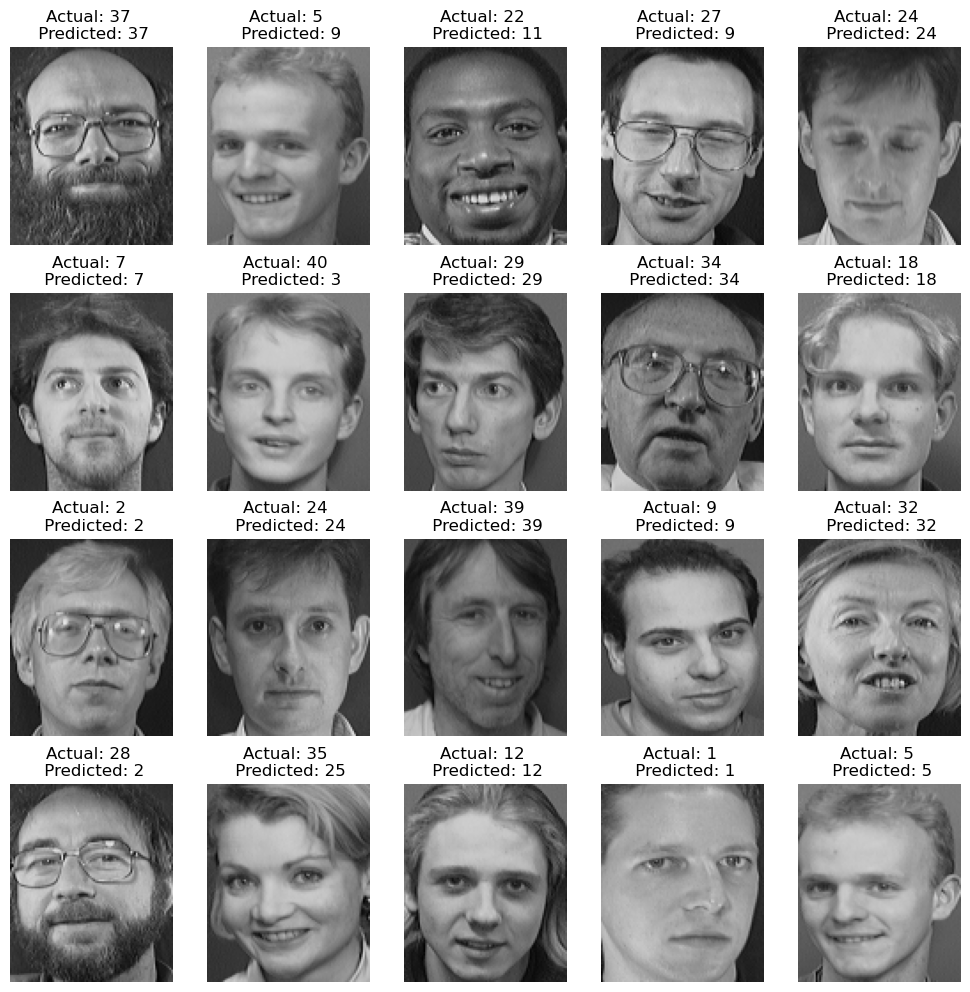

In [290]:
probability_matrix_svm_9, prediction_svm_9 = SVM_model(0.1, 0.001, 'rbf')


In [291]:
def generate_roc_det_curve(prob_mat):
    roc_fpr = np.zeros((40, 100))
    roc_tpr = np.zeros((40, 100))

    det_fpr = np.zeros((40, 100))
    det_fnr = np.zeros((40, 100))

    fig, [ax_roc, ax_det] = plt.subplots(1, 2, figsize=(11, 5))

    for i in range(1,40):
        fpr, tpr, _ = roc_curve(test_label == i, prob_mat[:, i])

        roc_fpr[i] = np.linspace(min(fpr), max(fpr), 100)
        roc_tpr[i] = np.interp(roc_fpr[i], fpr, tpr)

        fpr, fnr, _ = det_curve(test_label[:] == i, prob_mat[:, i])
        det_fpr[i] = np.linspace(min(fpr), max(fpr), 100)
        det_fnr[i] = np.interp(det_fpr[i], fpr, fnr)

    roc_mid_fpr = np.mean(roc_fpr, axis=0)
    roc_mid_tpr = np.mean(roc_tpr, axis=0)
    ax_roc.plot(roc_mid_fpr, roc_mid_tpr, label='ROC curve')

    det_mid_fpr = np.mean(det_fpr, axis=0)
    det_mid_fnr = np.mean(det_fnr, axis=0)
    ax_det.plot(det_mid_fpr, det_mid_fnr, label='DET curve')

    # draw a dotted line through the origin
    ax_roc.plot([0, 1], [0, 1], 'k--')
    ax_det.plot([0, 1], [1, 0], 'k--')

    ax_roc.set_xlabel('False Positive Rate')
    ax_roc.set_ylabel('True Positive Rate')
    ax_roc.set_title('ROC Curve')

    ax_det.set_xlabel('False Positive Rate')
    ax_det.set_ylabel('False Negative Rate')
    ax_det.set_title('DET Curve')



# Looking at the different ROC and DET curves

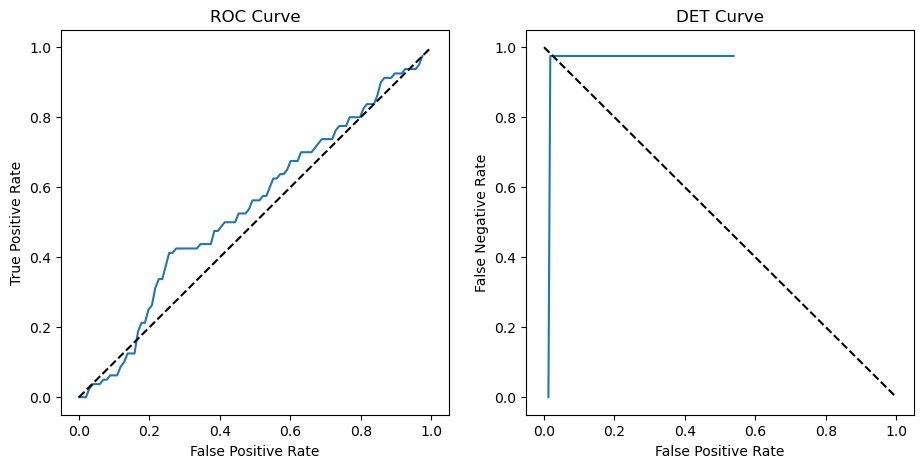

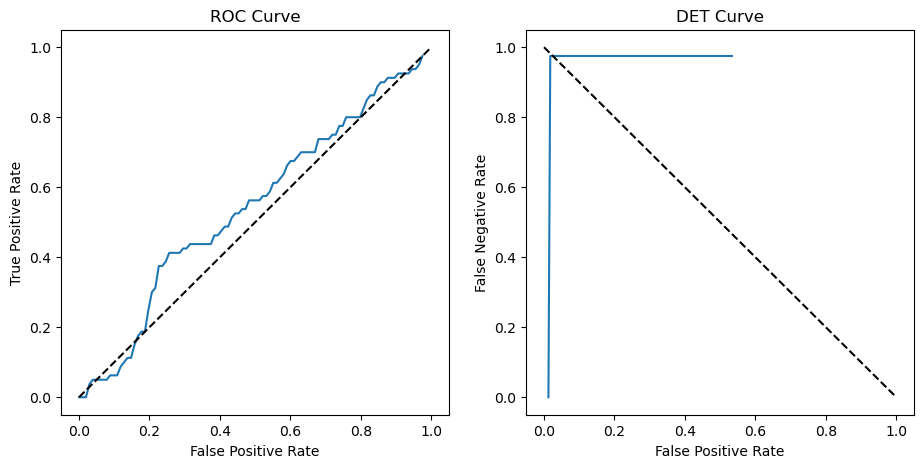

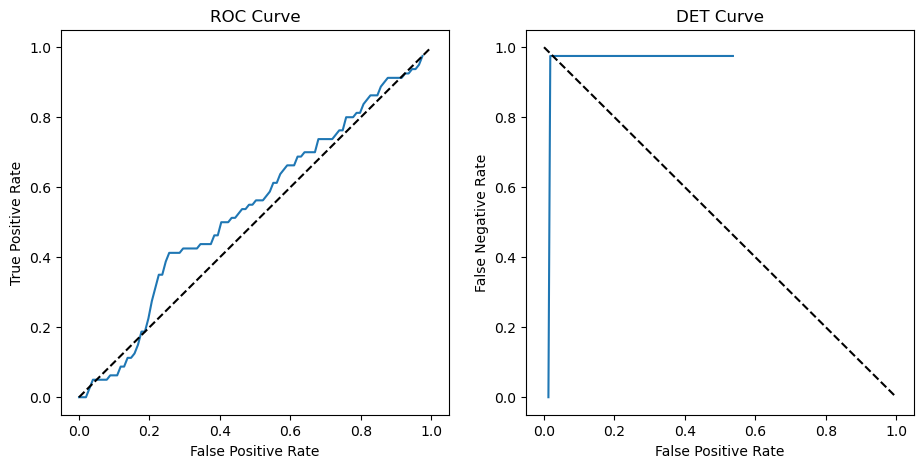

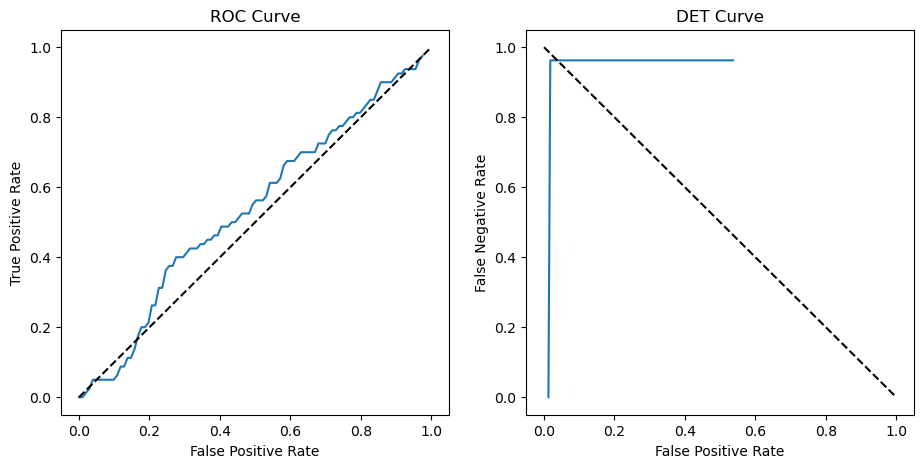

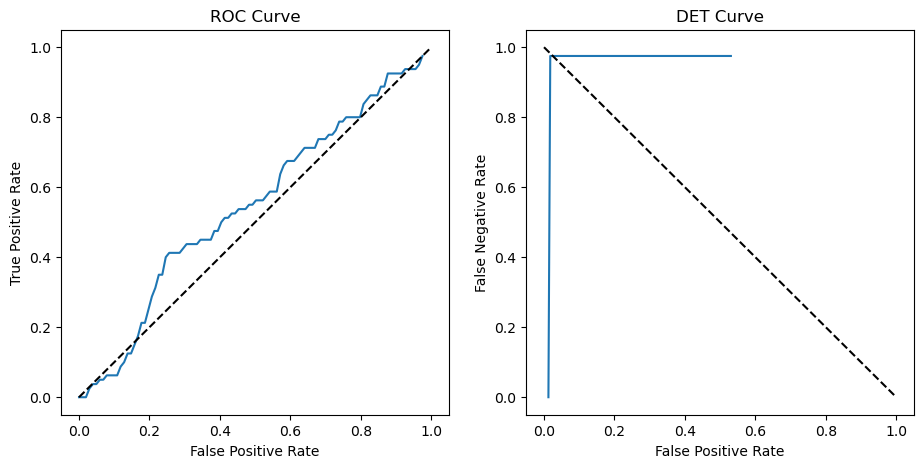

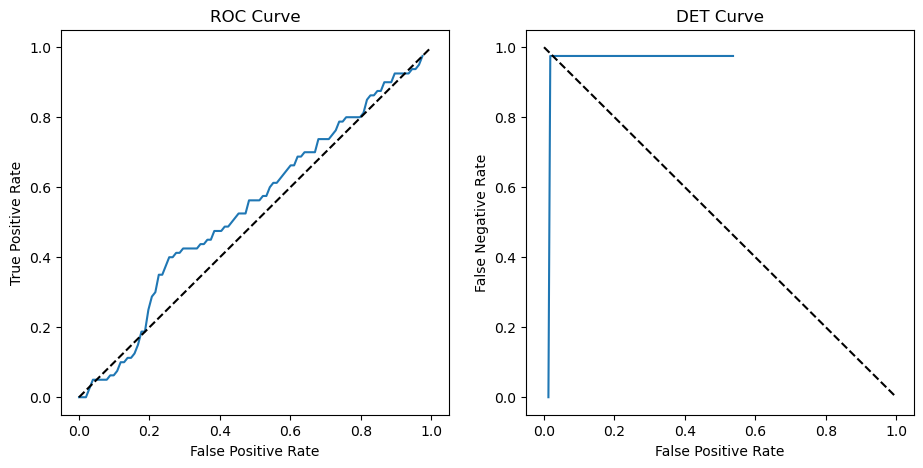

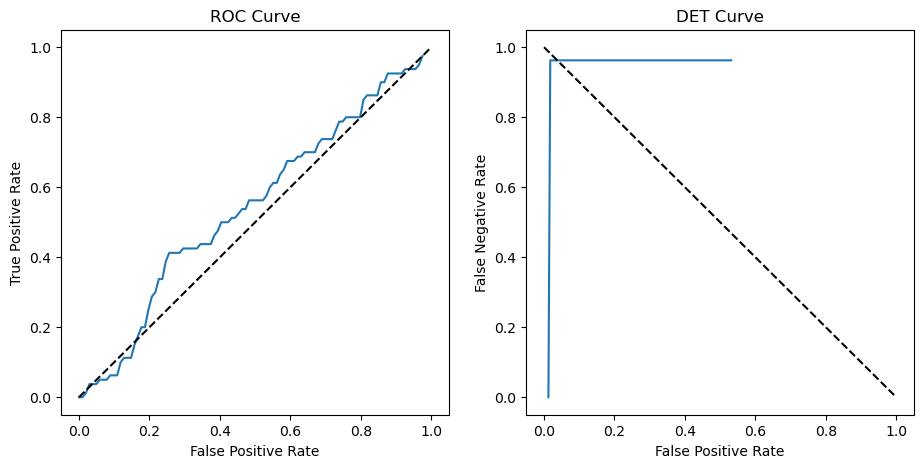

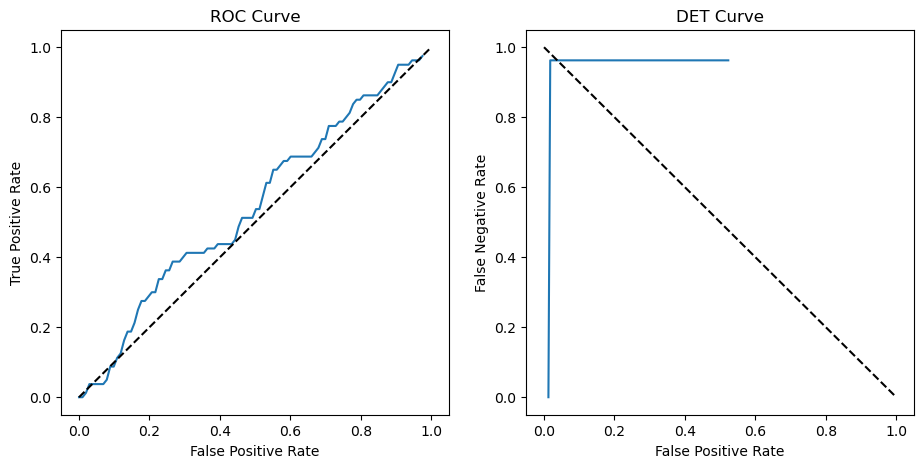

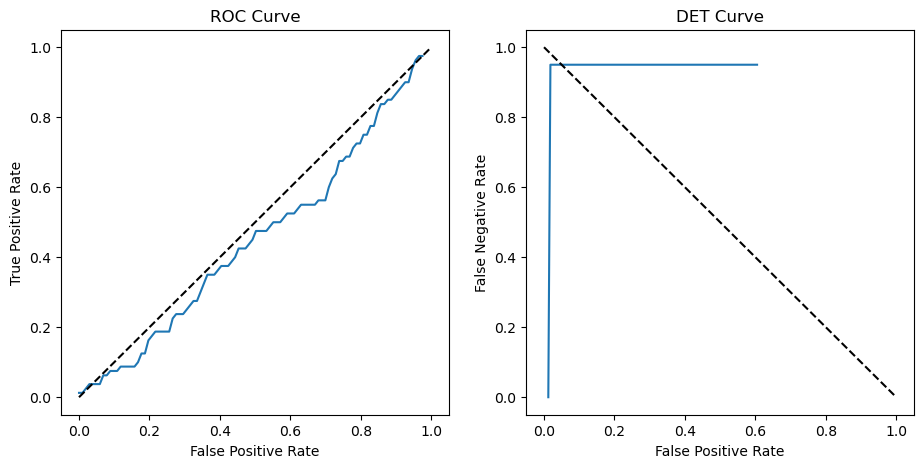

In [292]:
generate_roc_det_curve(probability_matrix_svm_1)
generate_roc_det_curve(probability_matrix_svm_2)
generate_roc_det_curve(probability_matrix_svm_3)
generate_roc_det_curve(probability_matrix_svm_4)
generate_roc_det_curve(probability_matrix_svm_5)
generate_roc_det_curve(probability_matrix_svm_6)
generate_roc_det_curve(probability_matrix_svm_7)
generate_roc_det_curve(probability_matrix_svm_8)
generate_roc_det_curve(probability_matrix_svm_9)

# Confustion matrix

In [293]:
# confusion matrix
def generate_confusion_matrix(pred):
    conf_matrix = confusion_matrix(test_label, pred)
    conf_matrix = conf_matrix / np.sum(conf_matrix, axis=1)
    conf_matrix = np.round(conf_matrix, 2)
    df_cm = pd.DataFrame(conf_matrix, index = [i for i in range(0, 40)],
                    columns = [i for i in range(0, 40)])
    plt.figure(figsize = (20,20))
    sns.heatmap(df_cm, annot=True)
    plt.show()


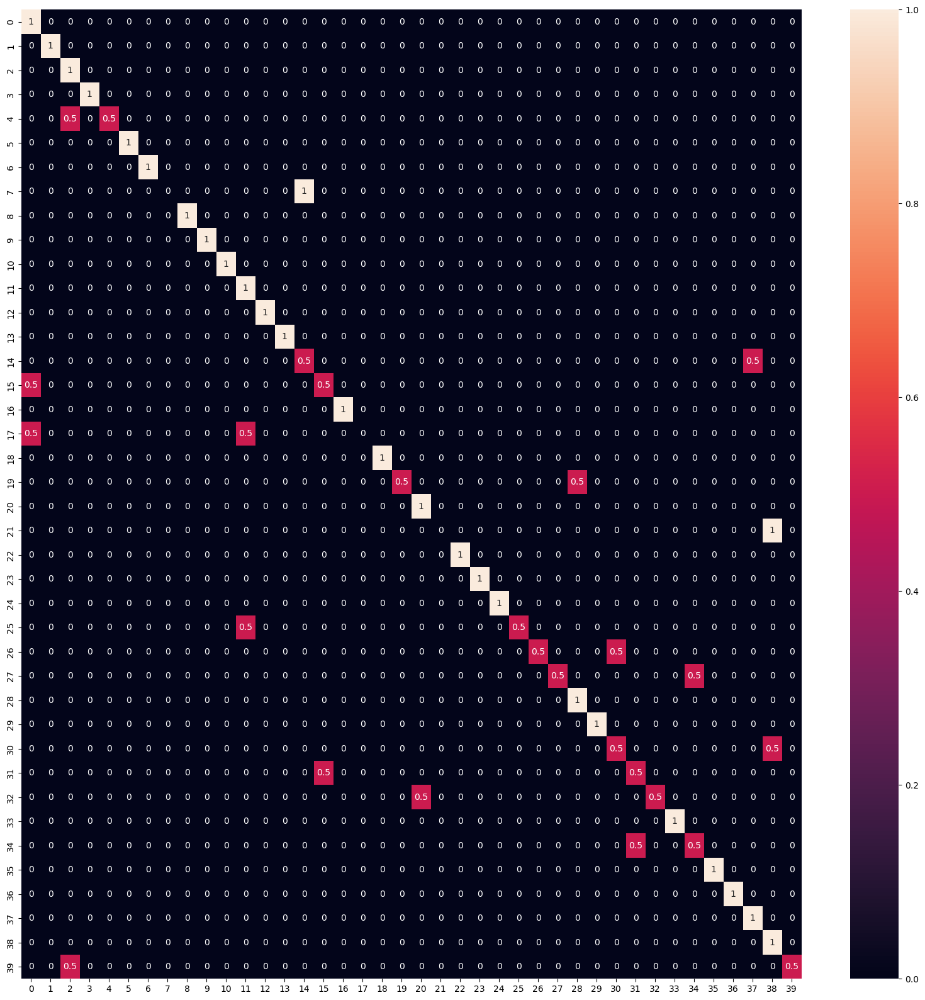

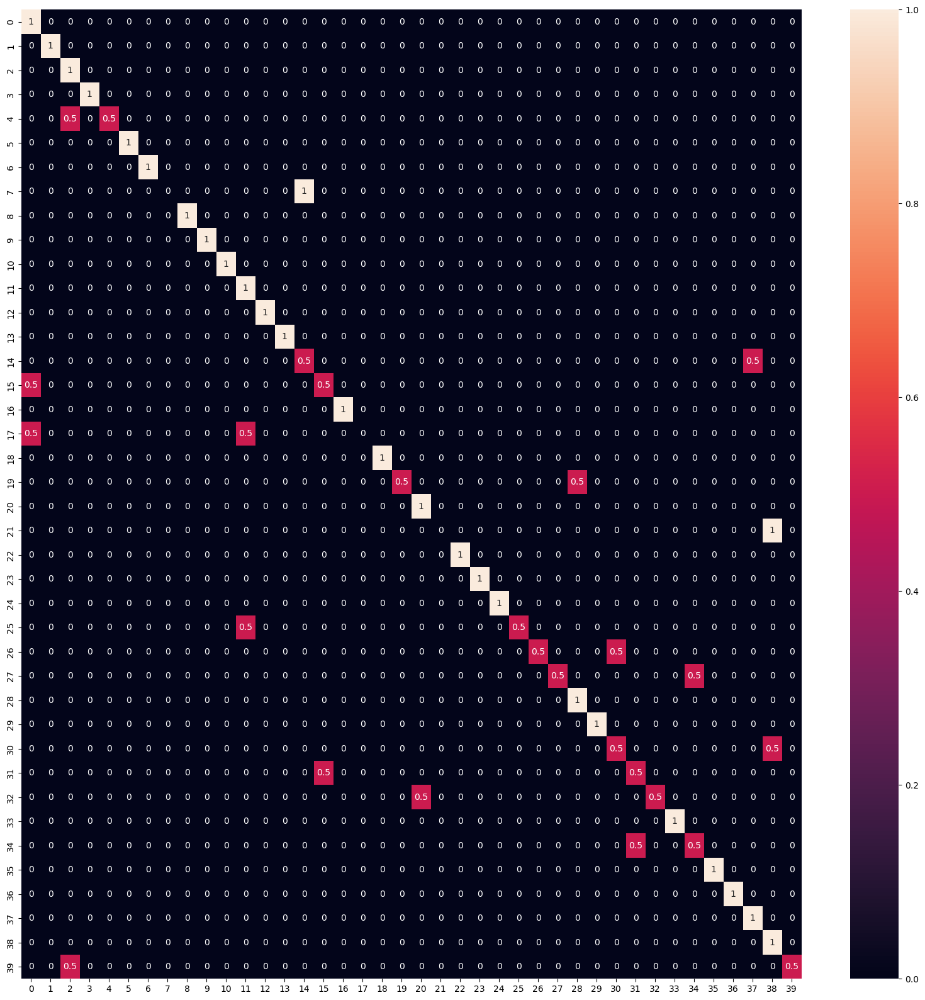

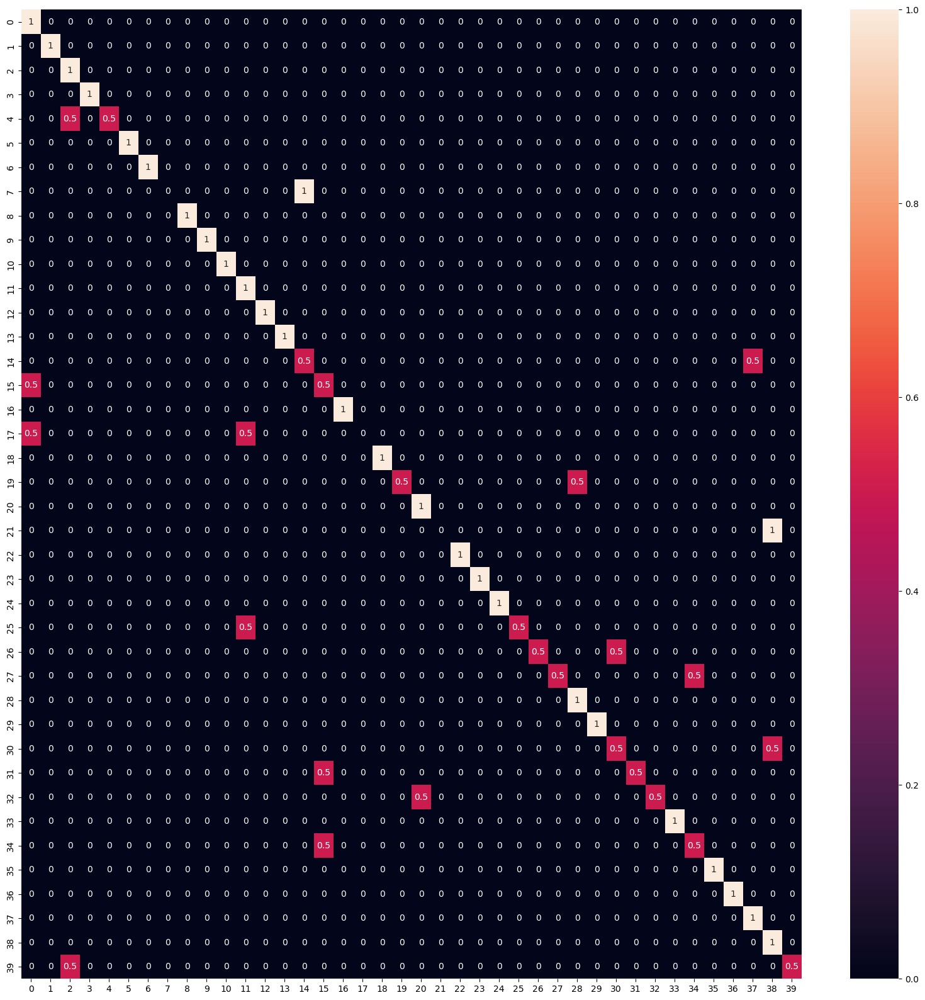

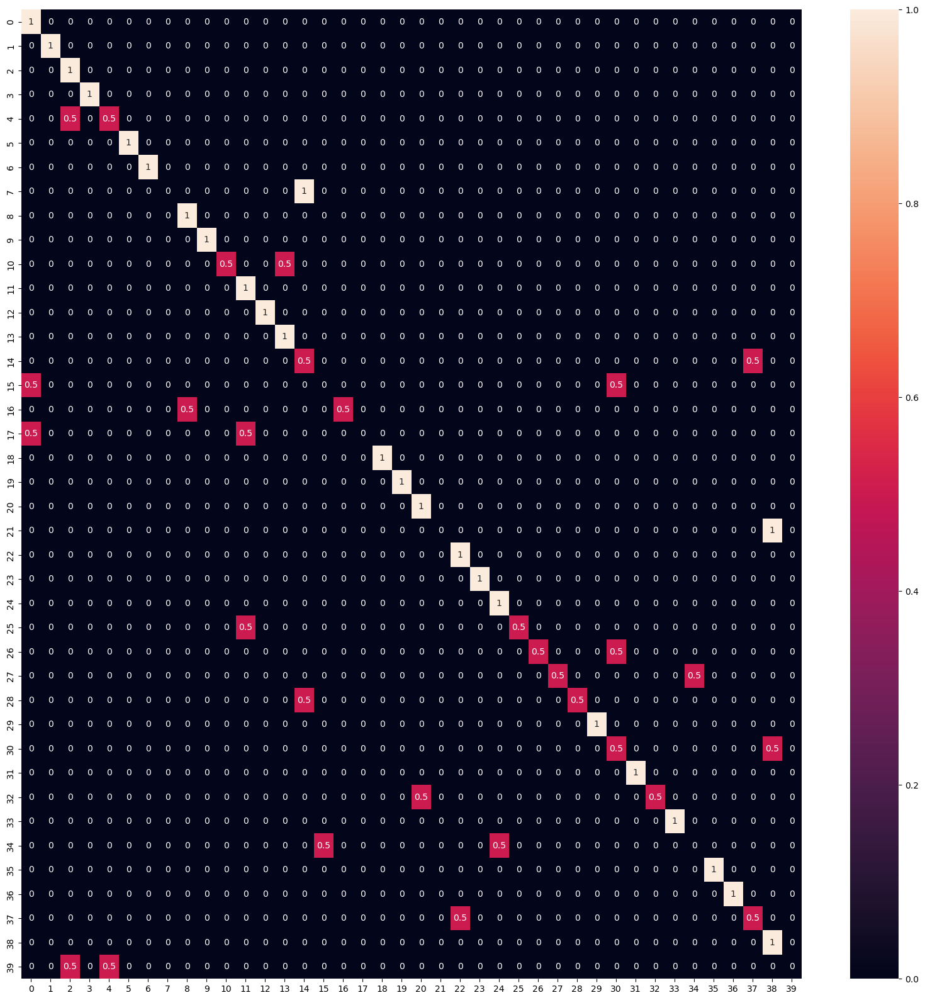

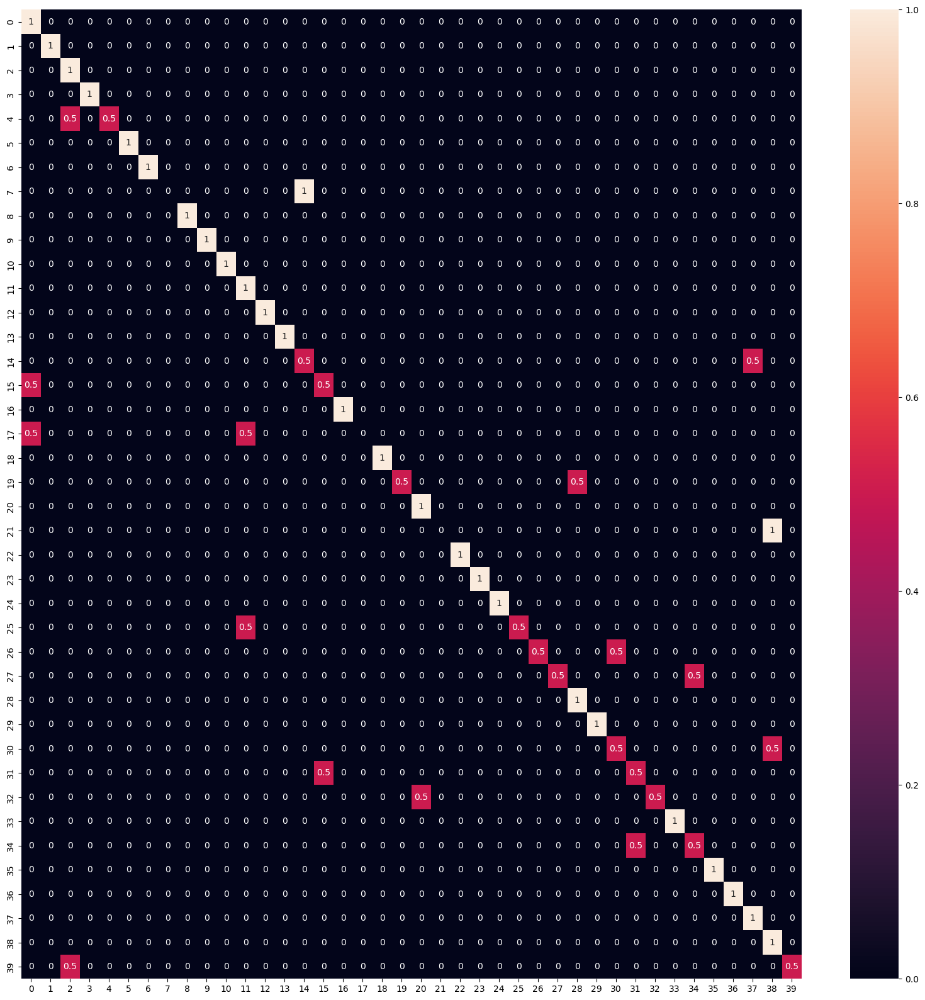

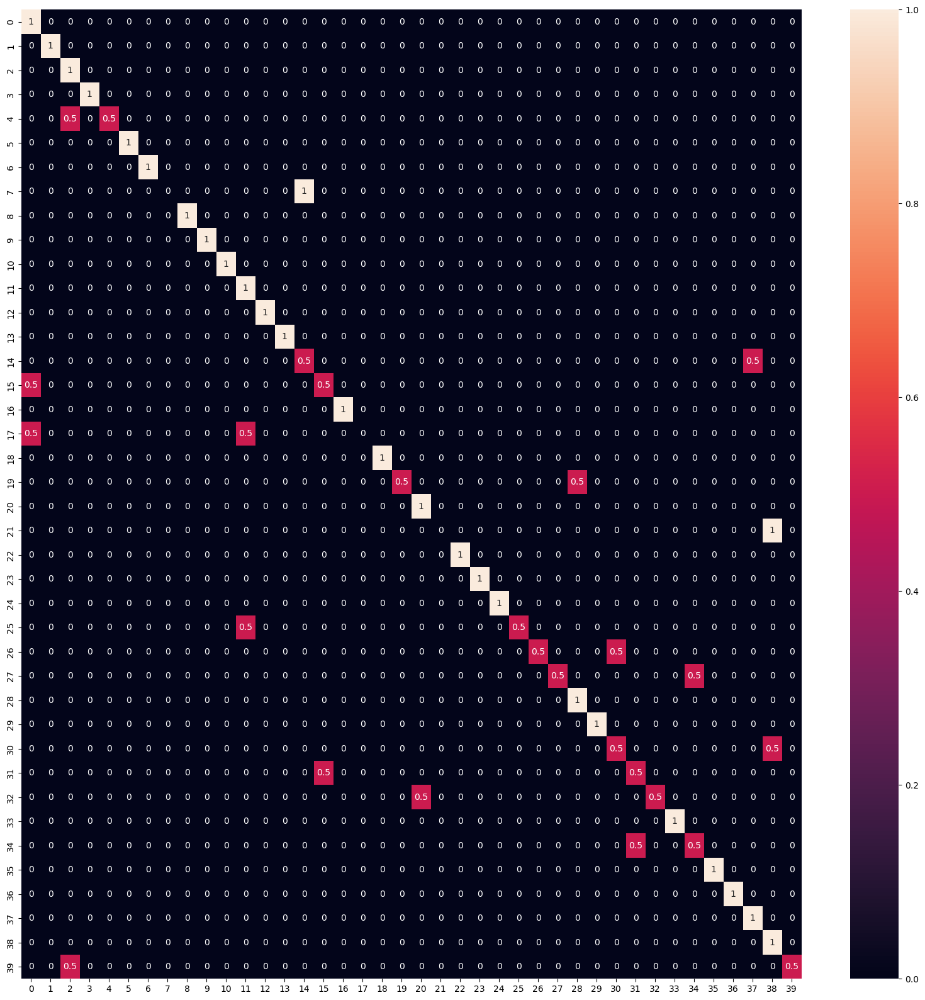

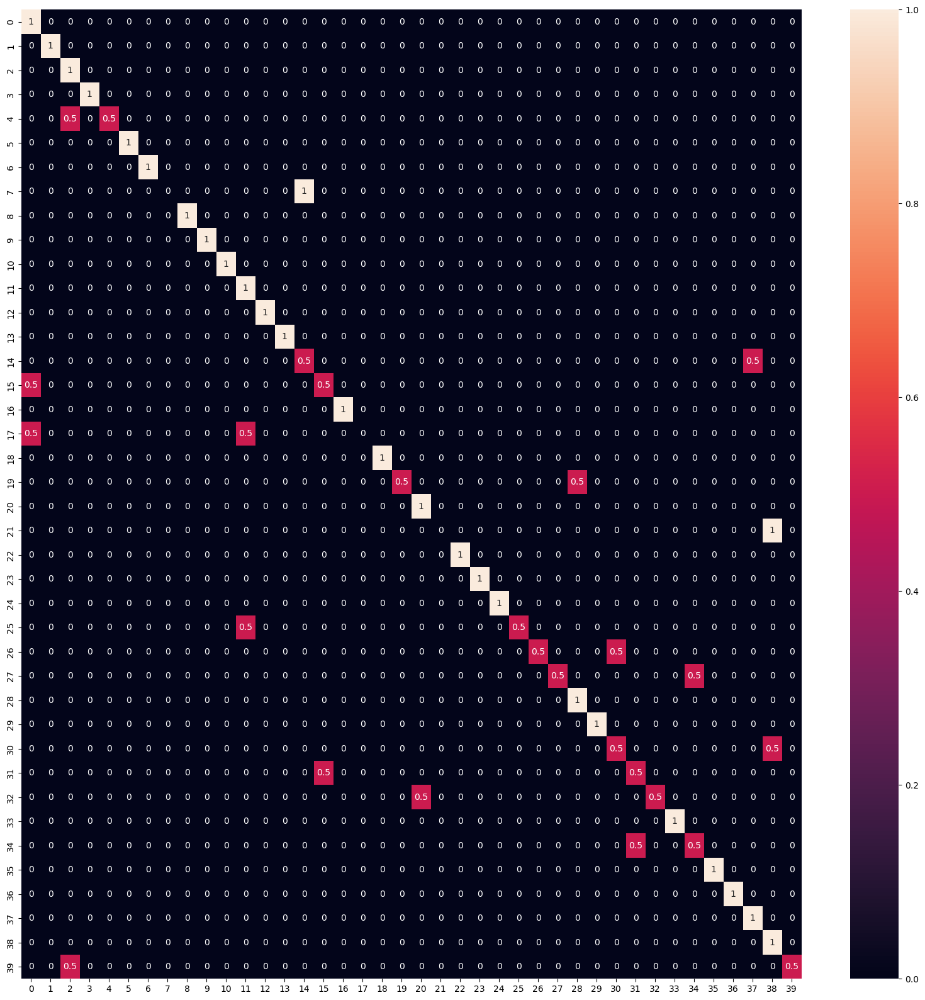

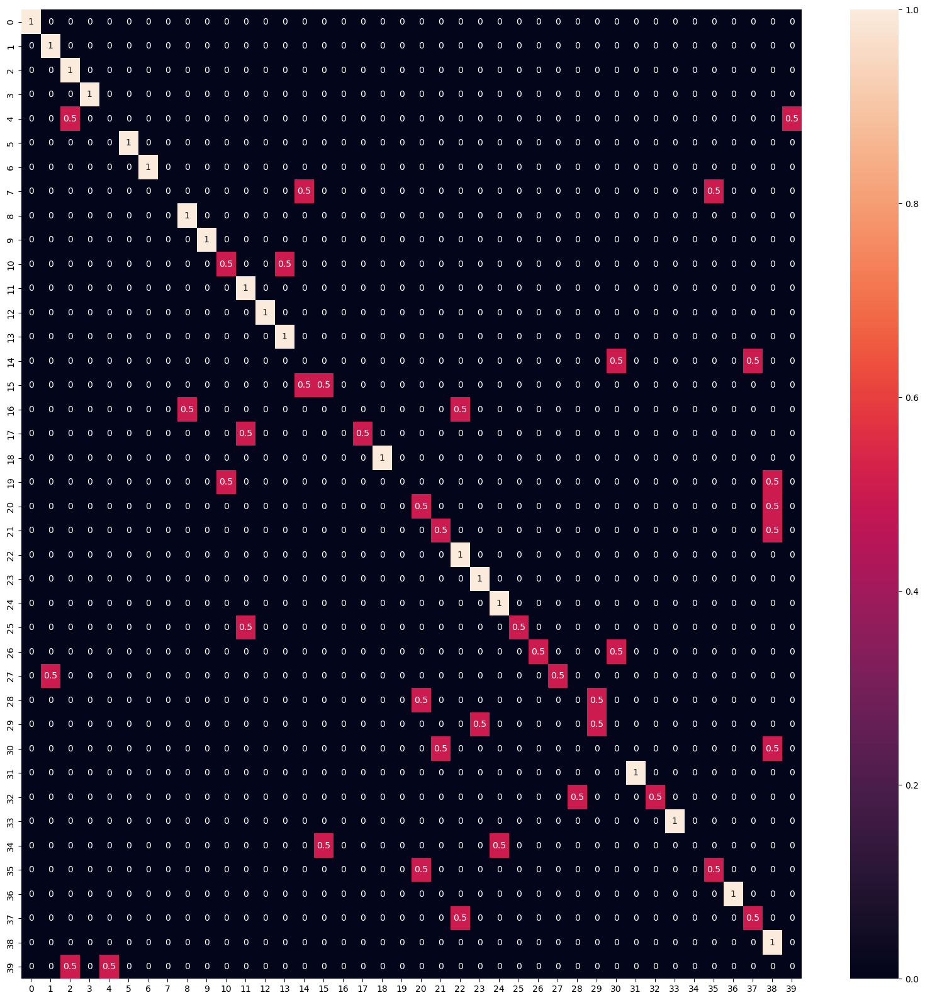

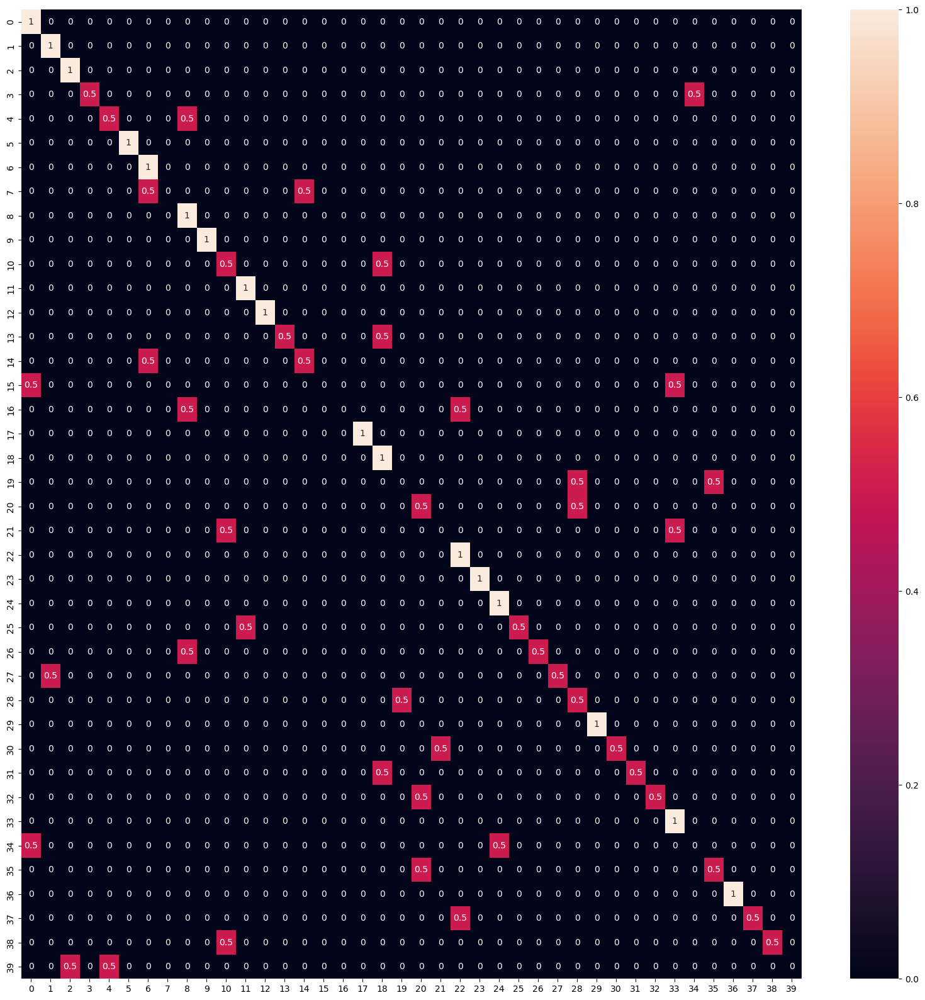

In [294]:
generate_confusion_matrix(prediction_svm_1)
generate_confusion_matrix(prediction_svm_2)
generate_confusion_matrix(prediction_svm_3)
generate_confusion_matrix(prediction_svm_4)
generate_confusion_matrix(prediction_svm_5)
generate_confusion_matrix(prediction_svm_6)
generate_confusion_matrix(prediction_svm_7)
generate_confusion_matrix(prediction_svm_8)
generate_confusion_matrix(prediction_svm_9)

# Multi-layer perceptron classification

In [308]:
def MLP_model(h1, h2, h3, LR, activation_func):

    train_paths = [f'train_dataset_{i+1}\\**\\*.pgm' for i in range(5)]
    test_paths = [f'test_dataset_{i+1}\\**\\*.pgm' for i in range(5)]

    accuracies = []

    prediction_mlp_ret = 0
    probability_matrix_mlp = 0
    max_accuracy = 0

    for i in range(5):
        train_data, train_label = get_data(train_paths[i])
        test_data, test_label = get_data(test_paths[i])

        mlp = MLPClassifier(hidden_layer_sizes=(h1, h2, h3), learning_rate_init= LR, random_state= 1, max_iter = 200, activation= activation_func)
        mlp.fit(train_data, train_label)

        # probability matrix NxM where N is number of samples and M is the number of classes
        probability_matrix_mlp = mlp.predict_proba(test_data)

        # Make prediction
        prediction_mlp = mlp.predict(test_data)

        # Calculate accuracy
        accuracy_mlp = mlp.score(test_data, test_label)

        if accuracy_mlp > max_accuracy:
            max_accuracy = accuracy_mlp
            probability_matrix_mlp = probability_matrix_mlp
            prediction_mlp_ret = prediction_mlp

        accuracies.append(accuracy_mlp)

        print('mlp accuracy fold {}: {:.2f}%'.format(i+1, accuracy_mlp * 100))

    print('Average accuracy: {:.2f}%'.format(np.mean(accuracies) * 100))

    plot_predictions(prediction_mlp_ret)

    return probability_matrix_mlp, prediction_mlp

### MLP layers = 128,64,128, Learing_rate = 0.001, activation_function = 'relu'

c:\Users\alime\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


mlp accuracy fold 1: 72.50%


c:\Users\alime\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


mlp accuracy fold 2: 70.00%


c:\Users\alime\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


mlp accuracy fold 3: 75.00%


c:\Users\alime\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


mlp accuracy fold 4: 67.50%


c:\Users\alime\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


mlp accuracy fold 5: 62.50%
Average accuracy: 69.50%


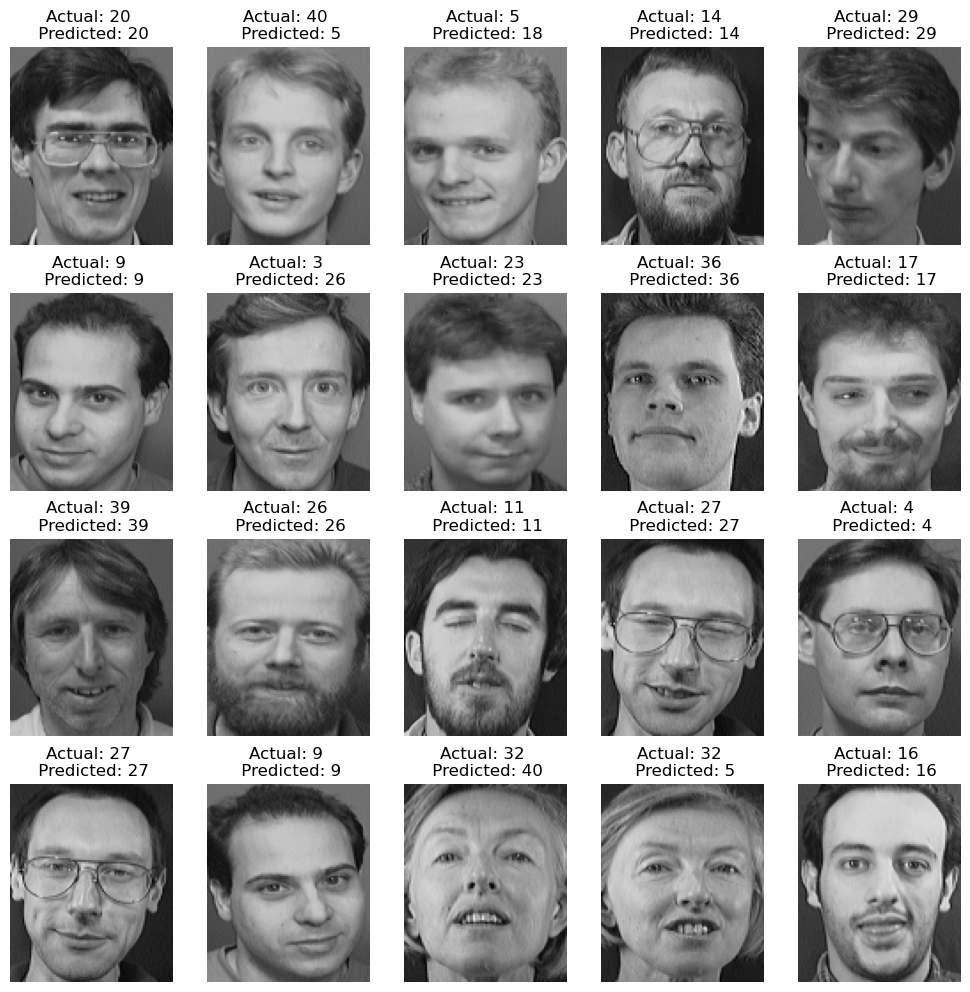

In [309]:
probability_matrix_mlp_1, prediction_mlp_1 =  MLP_model(128, 64, 128, 0.001, 'relu')


### MLP layers = 128,64,128, Learing_rate = 0.001, activation_function = 'logistic'

c:\Users\alime\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


mlp accuracy fold 1: 22.50%


c:\Users\alime\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


mlp accuracy fold 2: 28.75%


c:\Users\alime\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


mlp accuracy fold 3: 31.25%


c:\Users\alime\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


mlp accuracy fold 4: 27.50%


c:\Users\alime\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


mlp accuracy fold 5: 25.00%
Average accuracy: 27.00%


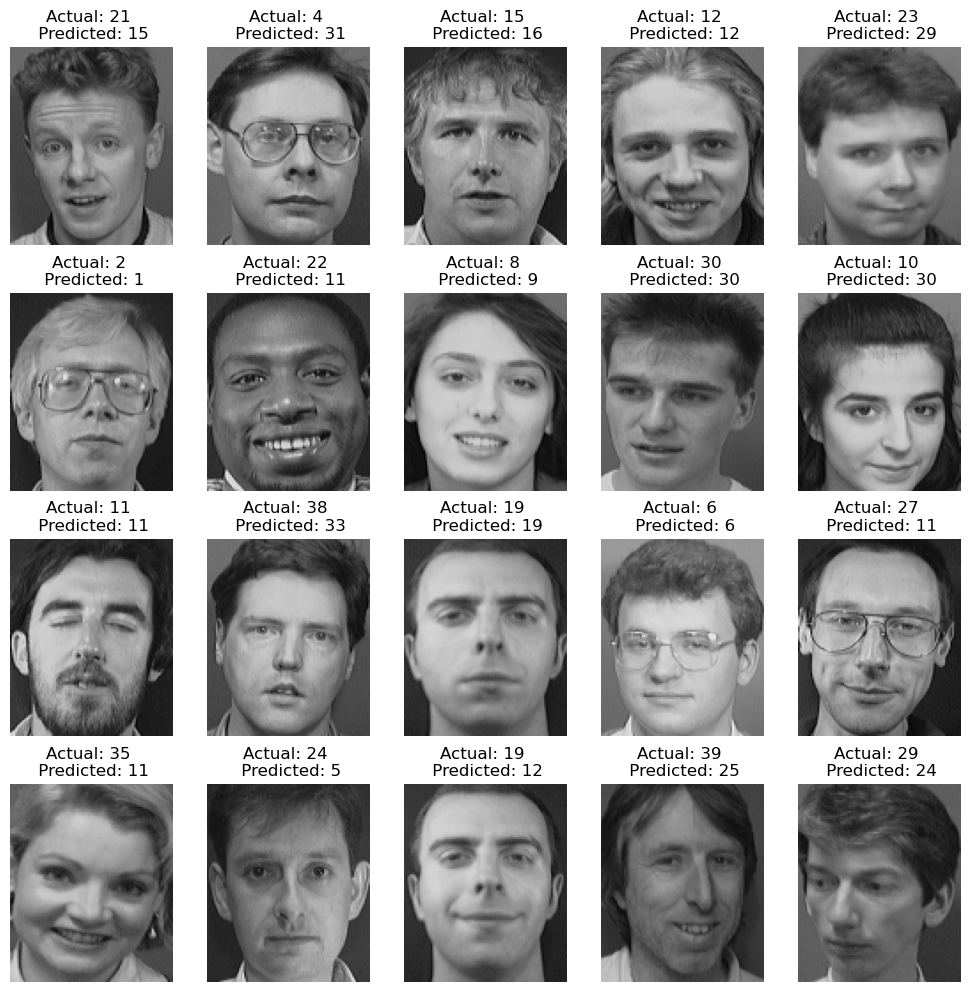

In [310]:
probability_matrix_mlp_2, prediction_mlp_2 =  MLP_model(128, 64, 128, 0.001, 'logistic')

### MLP layers = 128,64,128, Learing_rate = 0.001, activation_function = 'identity'

c:\Users\alime\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


mlp accuracy fold 1: 61.25%
mlp accuracy fold 2: 8.75%
mlp accuracy fold 3: 11.25%
mlp accuracy fold 4: 15.00%
mlp accuracy fold 5: 5.00%
Average accuracy: 20.25%


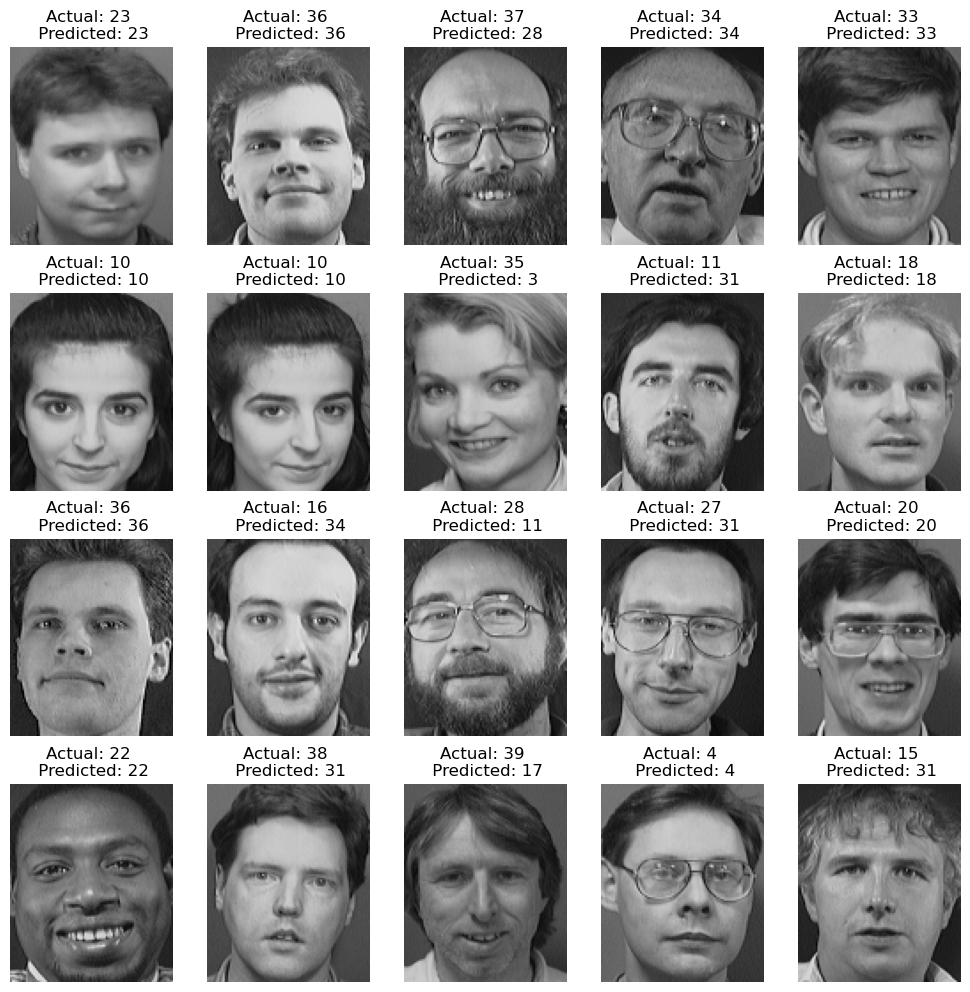

In [311]:
probability_matrix_mlp_3, prediction_mlp_3 =  MLP_model(128, 64, 128, 0.001, 'identity')

### MLP layers = 128,64,128, Learing_rate = 0.001, activation_function = 'tanh'

mlp accuracy fold 1: 33.75%


c:\Users\alime\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


mlp accuracy fold 2: 45.00%
mlp accuracy fold 3: 26.25%
mlp accuracy fold 4: 37.50%
mlp accuracy fold 5: 50.00%
Average accuracy: 38.50%


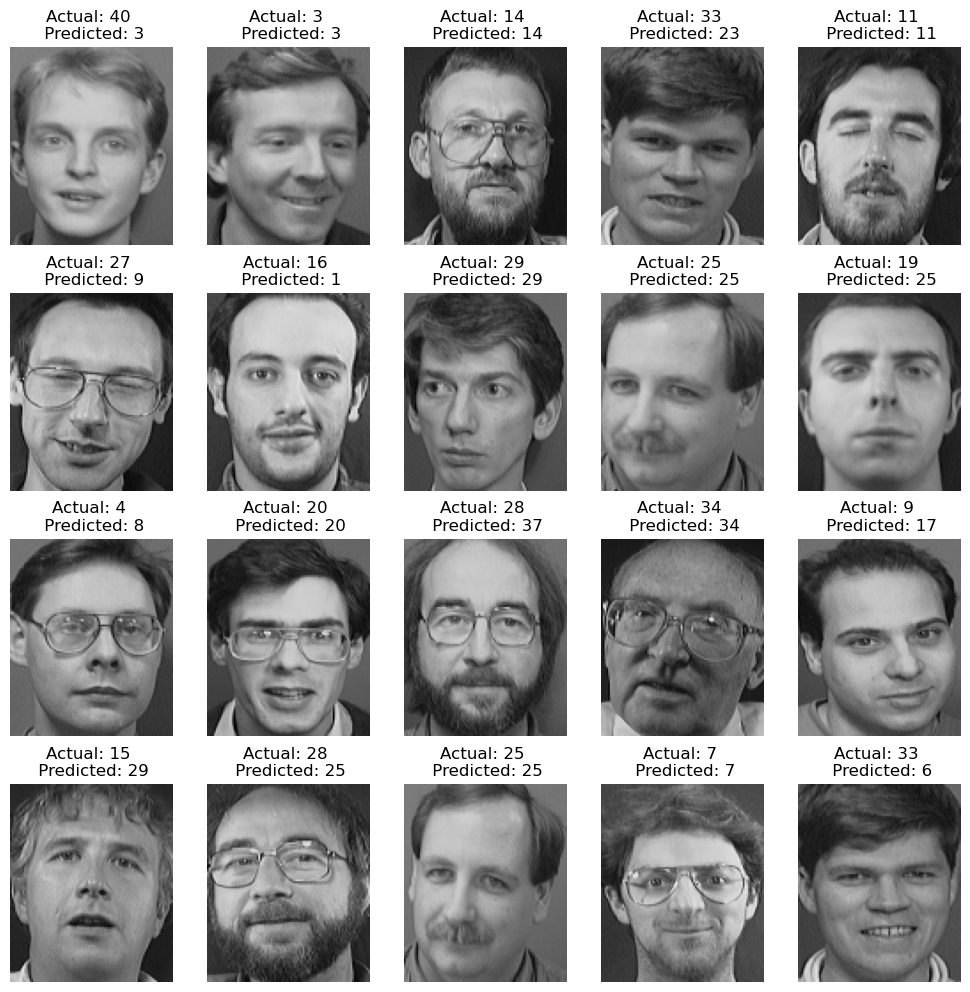

In [312]:
probability_matrix_mlp_4, prediction_mlp_4 =  MLP_model(128, 64, 128, 0.001, 'tanh')

### MLP layers = 128,64,128, Learing_rate = 0.0001, activation_function = 'relu'

c:\Users\alime\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


mlp accuracy fold 1: 63.75%


c:\Users\alime\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


mlp accuracy fold 2: 65.00%


c:\Users\alime\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


mlp accuracy fold 3: 77.50%


c:\Users\alime\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


mlp accuracy fold 4: 63.75%


c:\Users\alime\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


mlp accuracy fold 5: 63.75%
Average accuracy: 66.75%


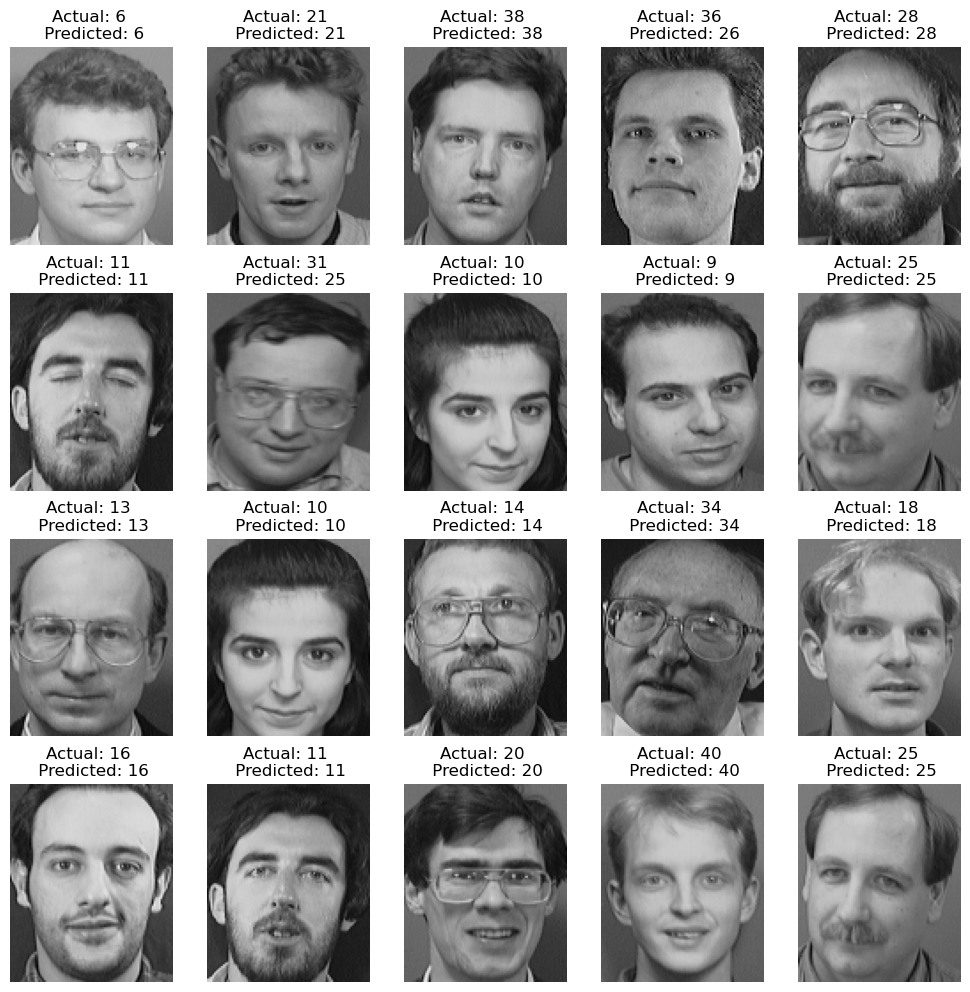

In [313]:
probability_matrix_mlp_5, prediction_mlp_5 =  MLP_model(128, 64, 128, 0.0001, 'relu')

### MLP layers = 128,64,128, Learing_rate = 0.01, activation_function = 'relu'

mlp accuracy fold 1: 37.50%
mlp accuracy fold 2: 35.00%
mlp accuracy fold 3: 2.50%
mlp accuracy fold 4: 57.50%
mlp accuracy fold 5: 7.50%
Average accuracy: 28.00%


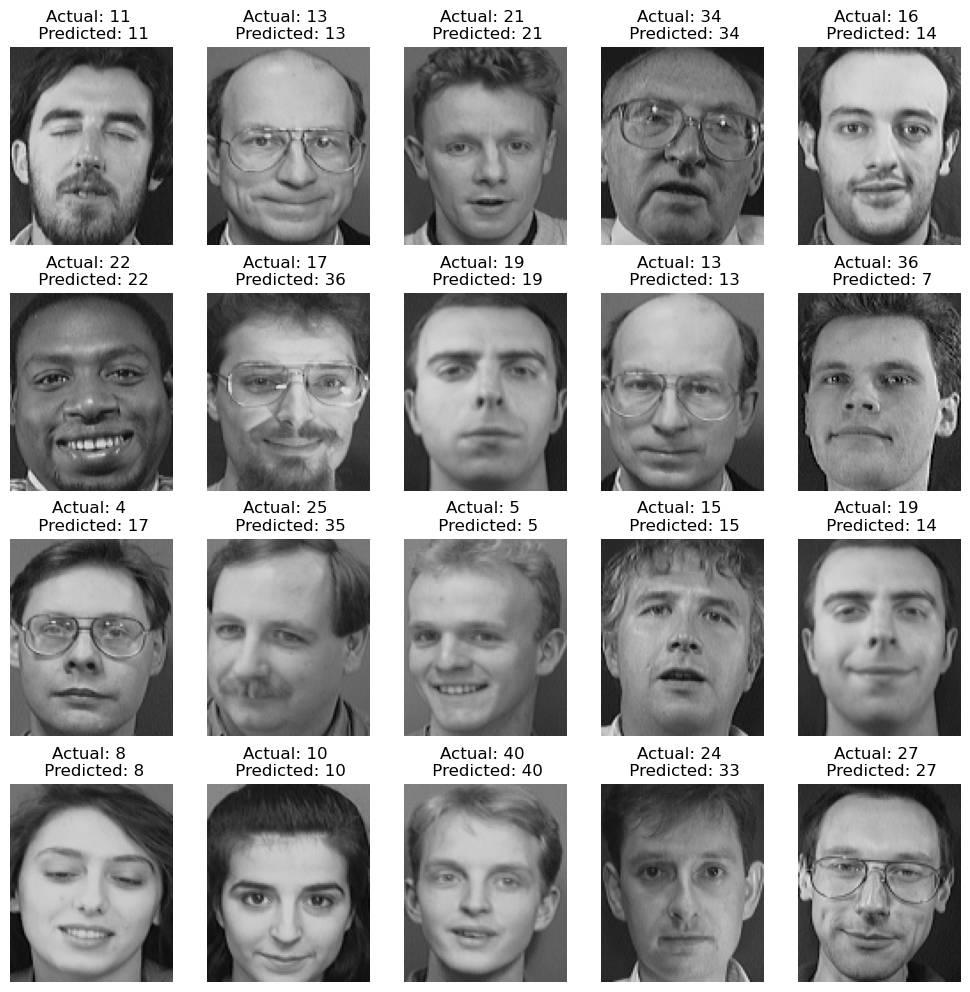

In [314]:
probability_matrix_mlp_6, prediction_mlp_6 =  MLP_model(128, 64, 128, 0.01, 'relu')

### MLP layers = 256,128,256, Learing_rate = 0.001, activation_function = 'relu'

c:\Users\alime\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


mlp accuracy fold 1: 68.75%


c:\Users\alime\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


mlp accuracy fold 2: 76.25%


c:\Users\alime\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


mlp accuracy fold 3: 78.75%


c:\Users\alime\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


mlp accuracy fold 4: 67.50%


c:\Users\alime\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


mlp accuracy fold 5: 72.50%
Average accuracy: 72.75%


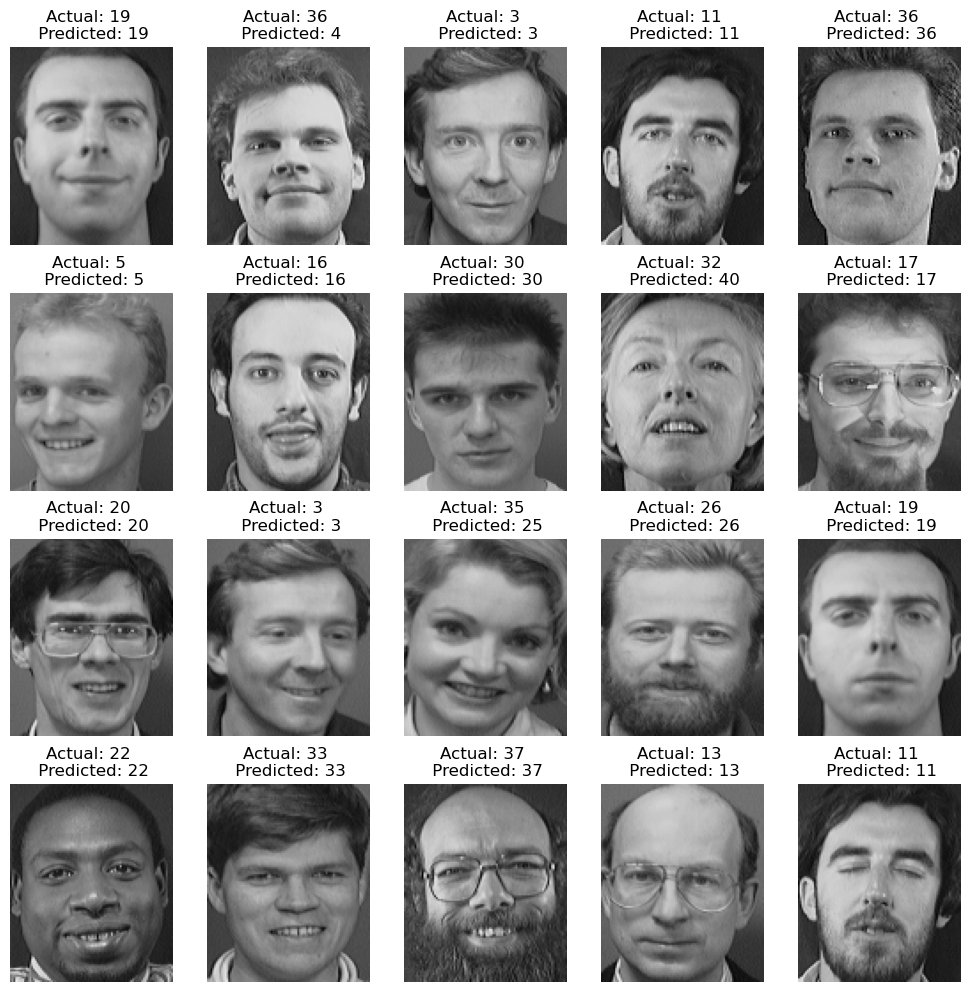

In [315]:
probability_matrix_mlp_7, prediction_mlp_7 =  MLP_model(256, 128, 256, 0.001, 'relu')

### MLP layers = 512,256,512, Learing_rate = 0.001, activation_function = 'relu'

c:\Users\alime\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


MLP accuracy: 72.50%


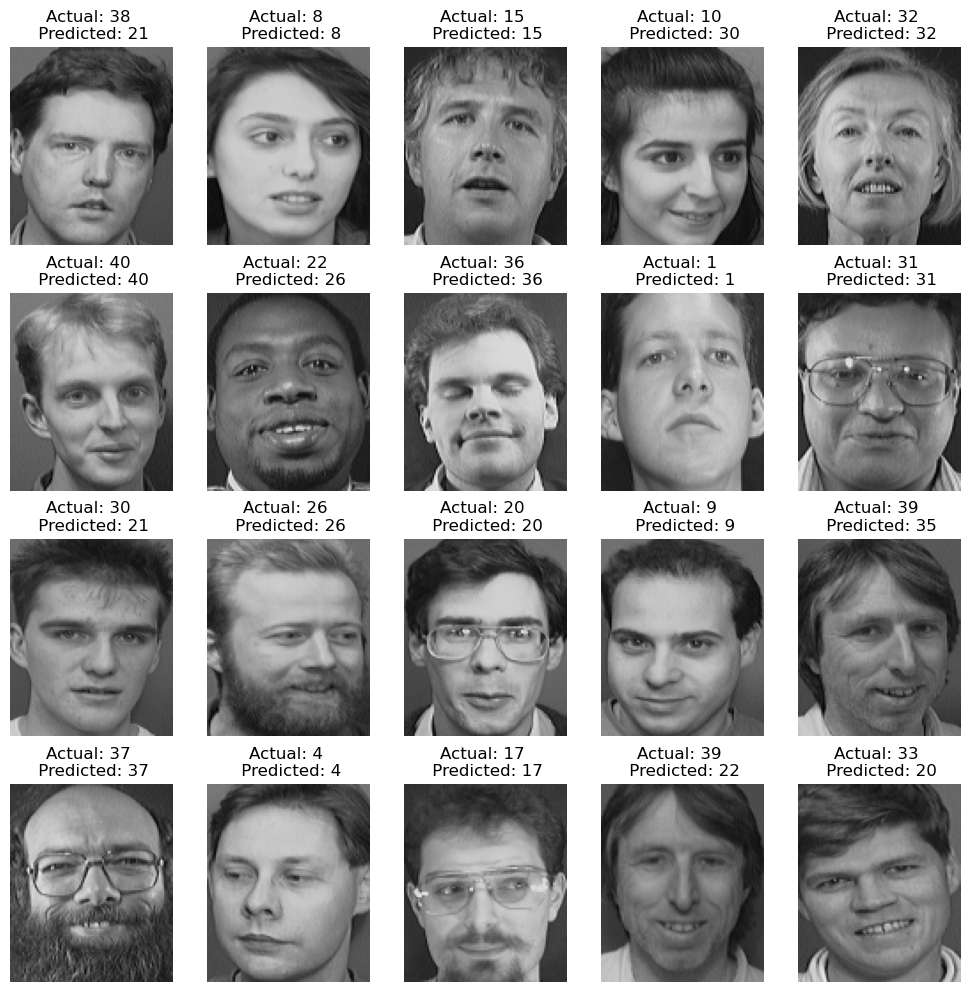

In [209]:
probability_matrix_mlp_8, prediction_mlp_8 =  MLP_model(512, 256, 512, 0.001, 'relu')

## ROC and DET curves for MLP

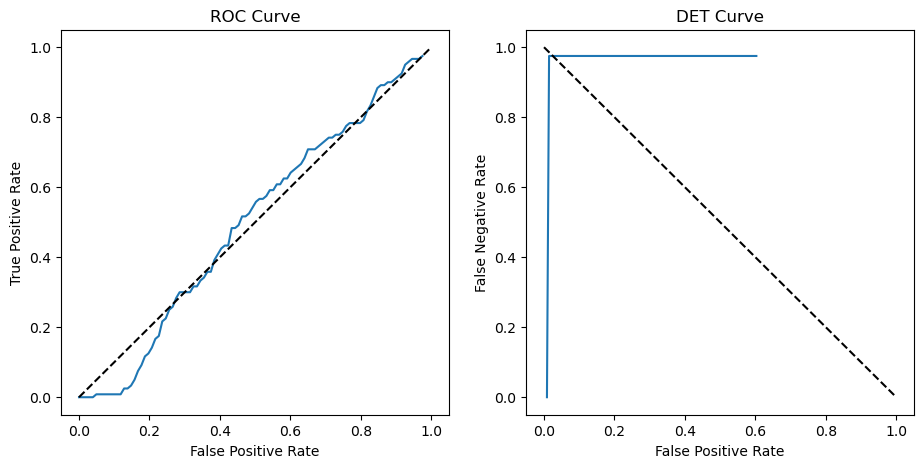

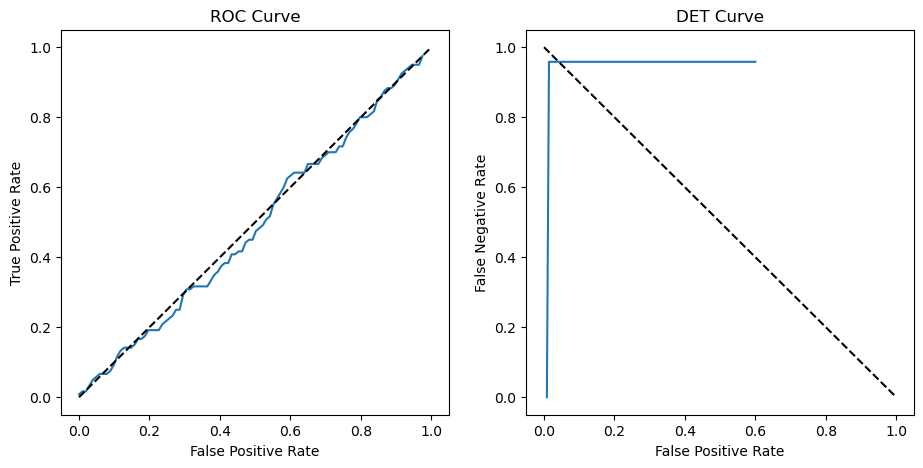

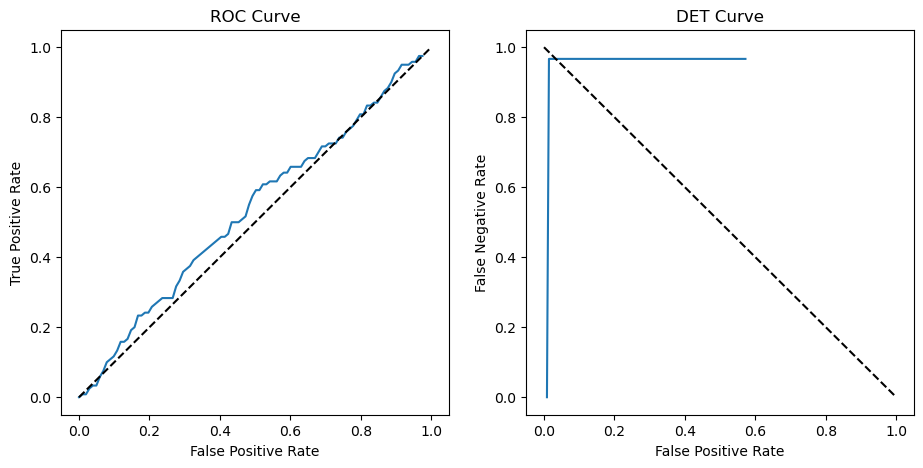

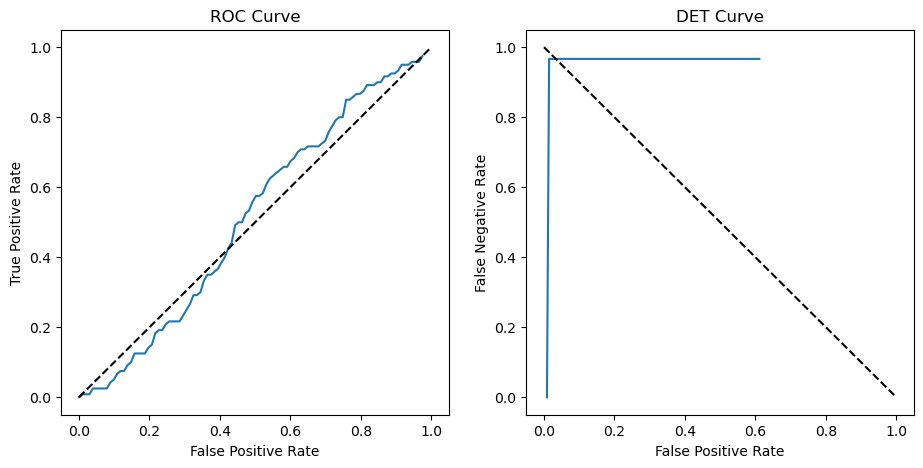

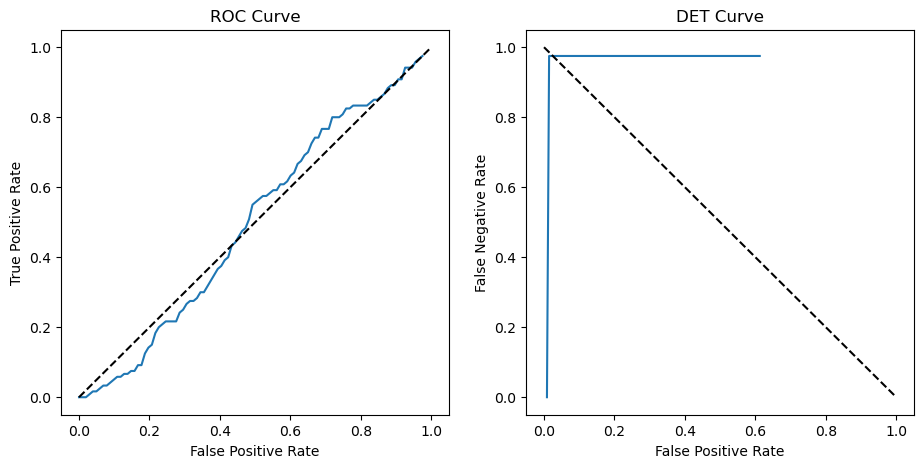

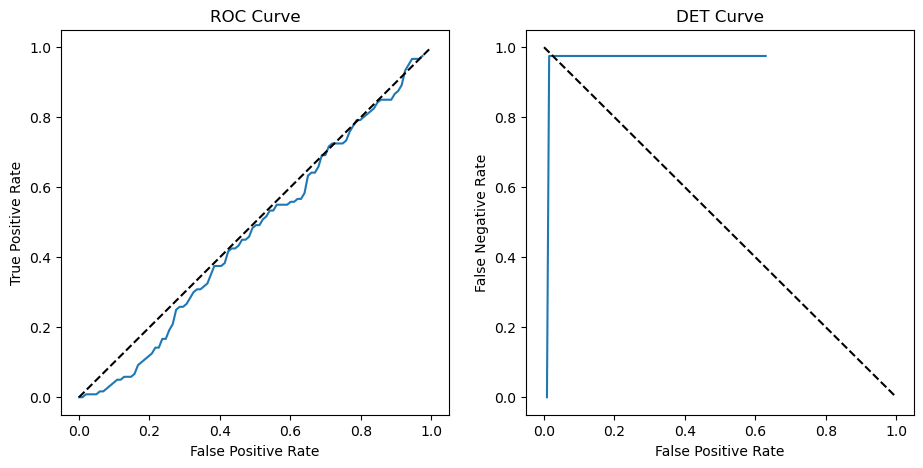

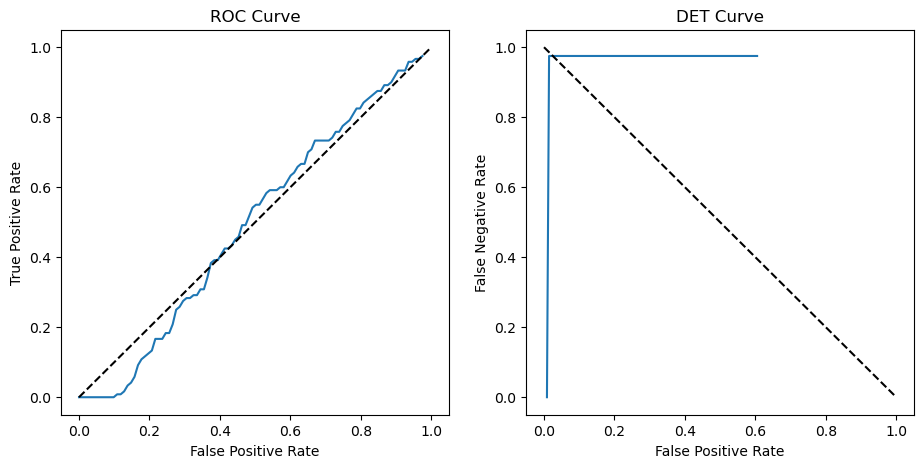

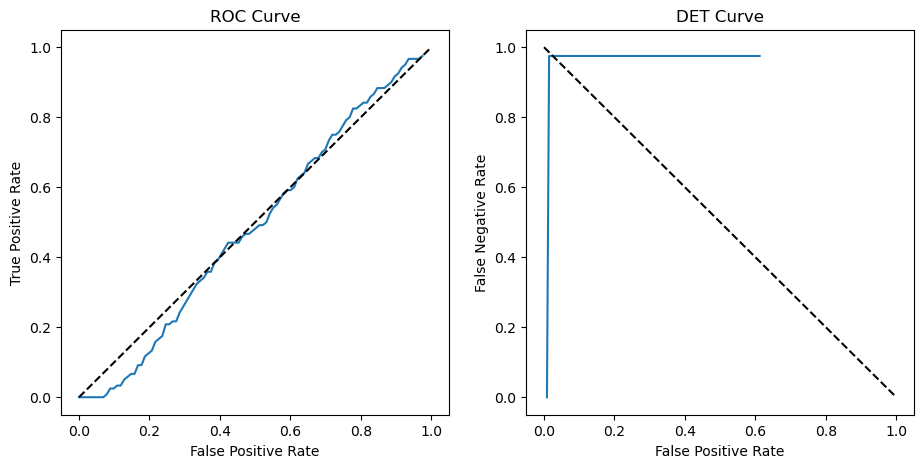

In [174]:
generate_roc_det_curve(probability_matrix_mlp_1)
generate_roc_det_curve(probability_matrix_mlp_2)
generate_roc_det_curve(probability_matrix_mlp_3)
generate_roc_det_curve(probability_matrix_mlp_4)
generate_roc_det_curve(probability_matrix_mlp_5)
generate_roc_det_curve(probability_matrix_mlp_6)
generate_roc_det_curve(probability_matrix_mlp_7)
generate_roc_det_curve(probability_matrix_mlp_8)

## Confusion Matrix for MLP

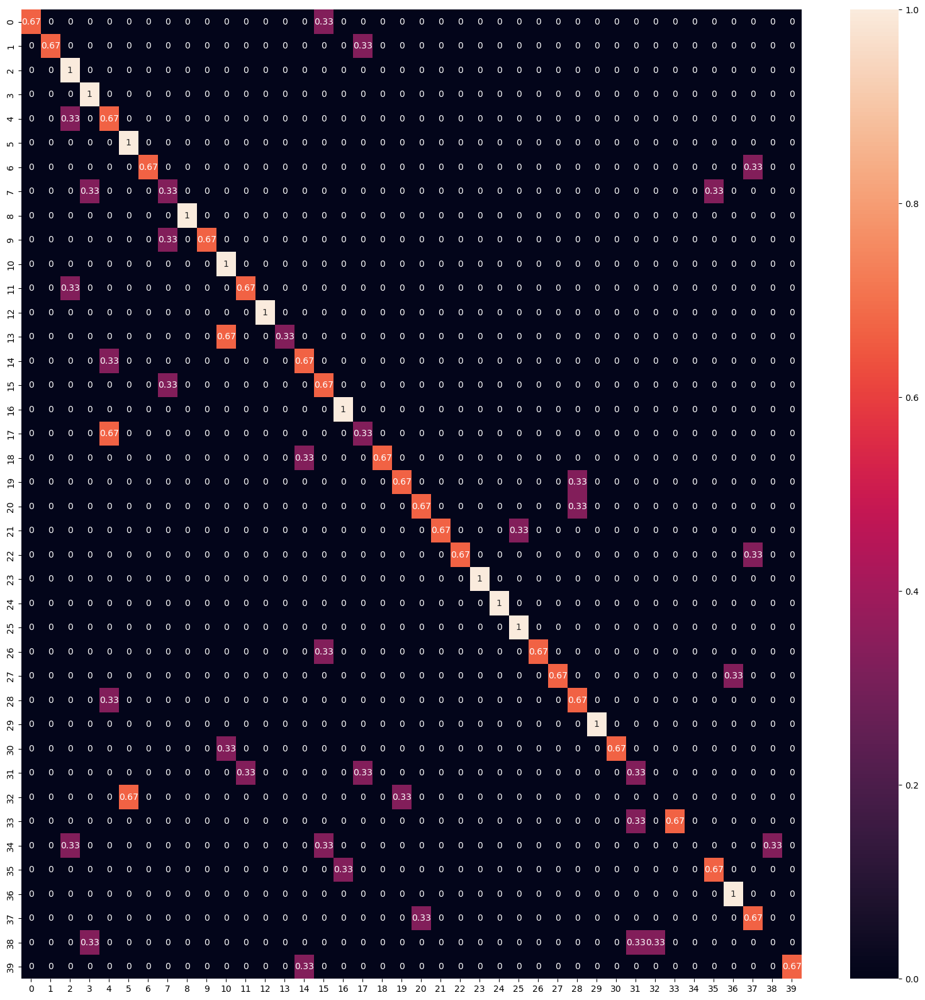

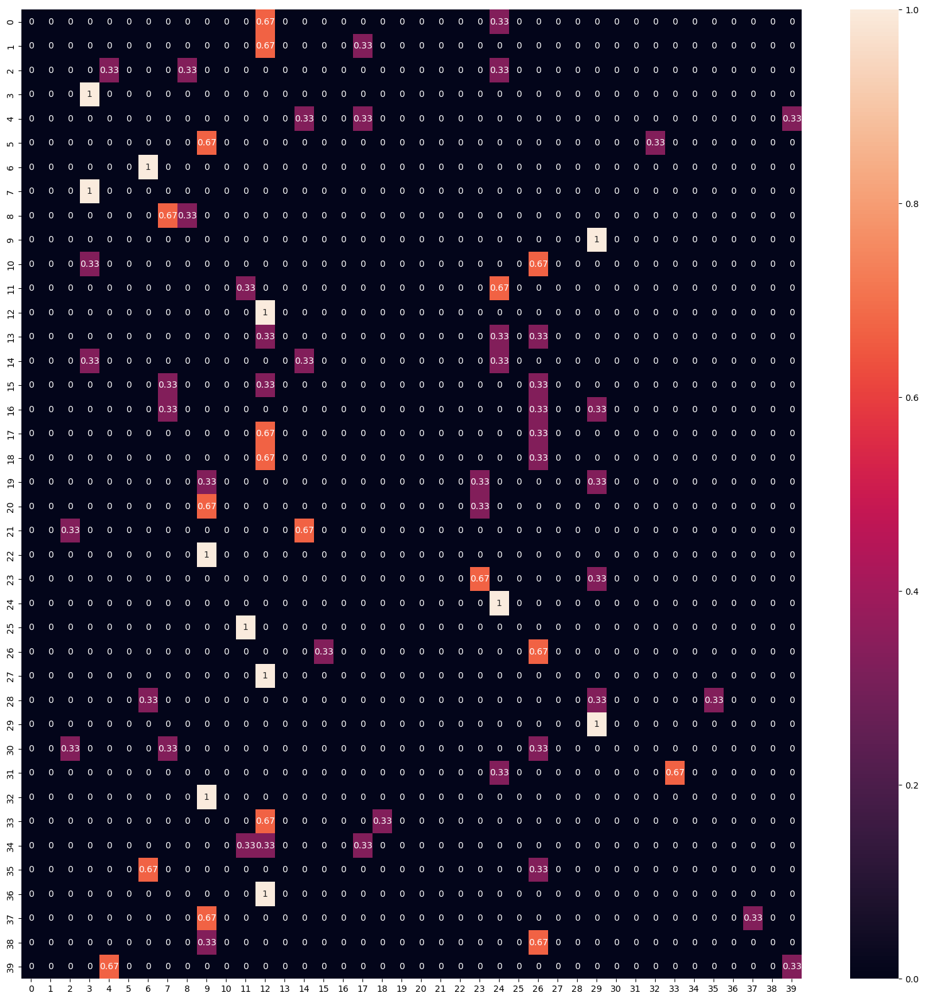

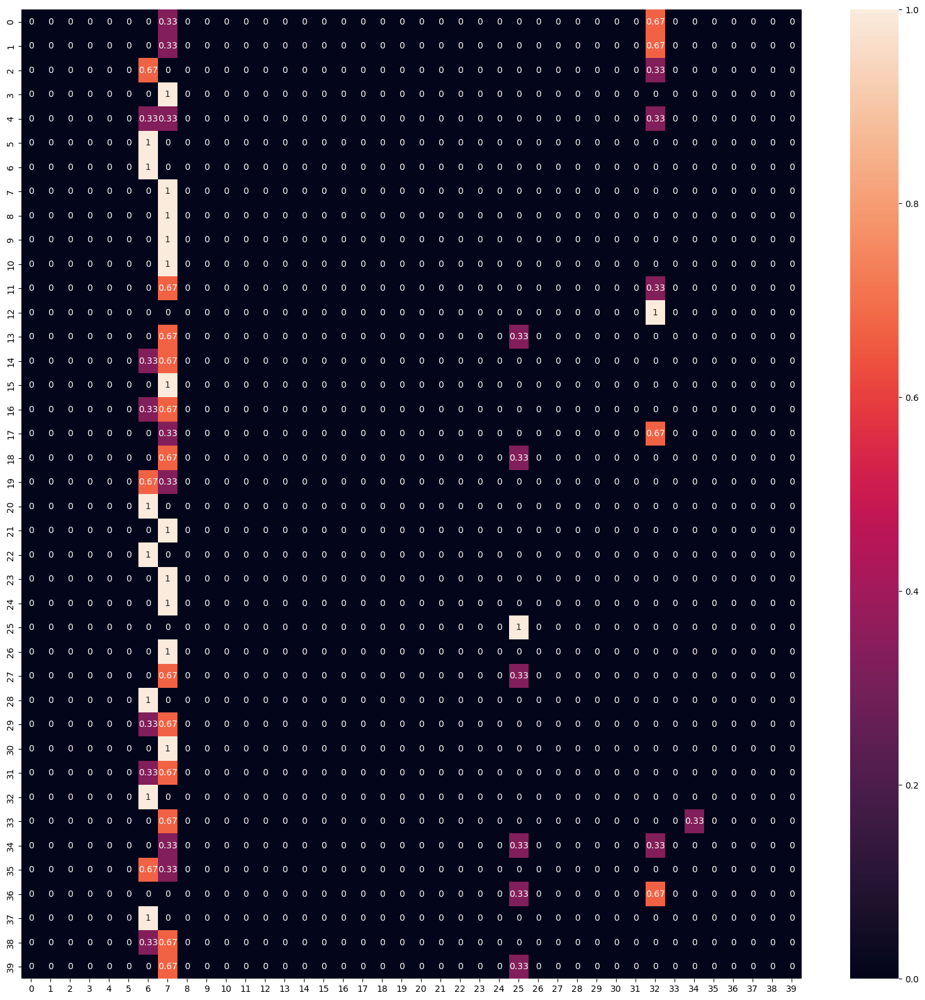

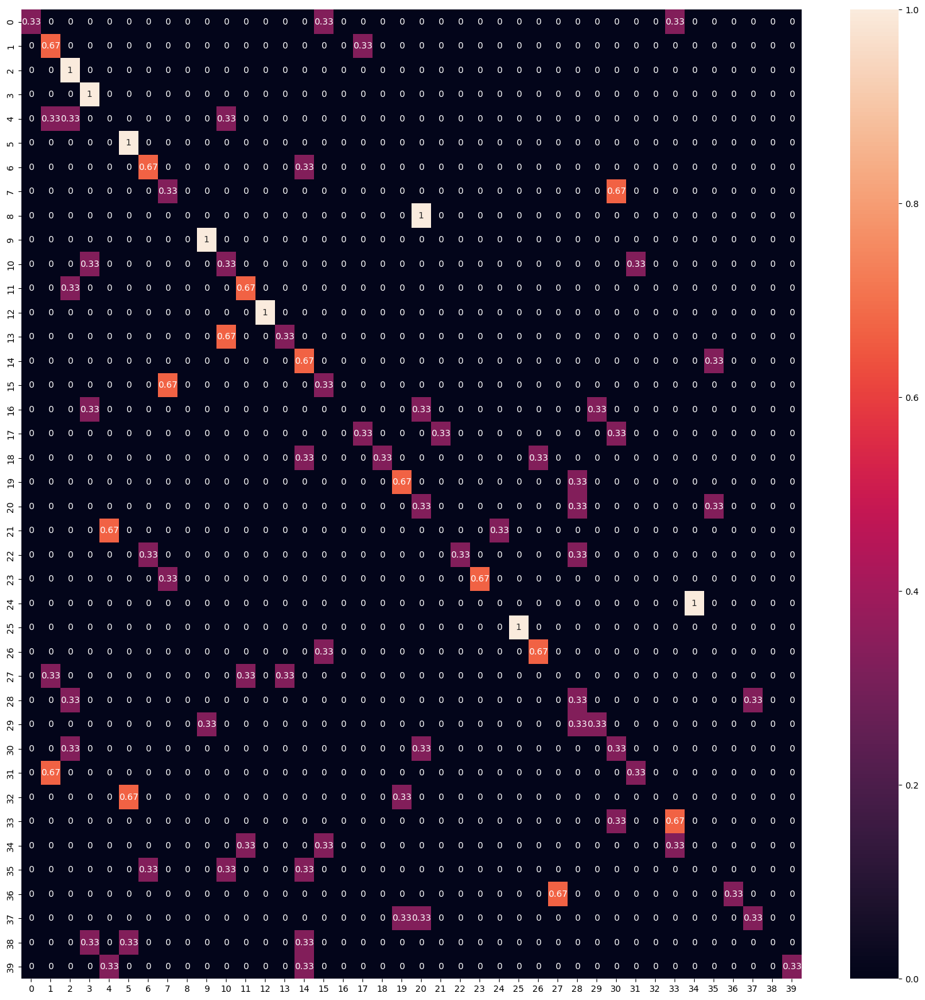

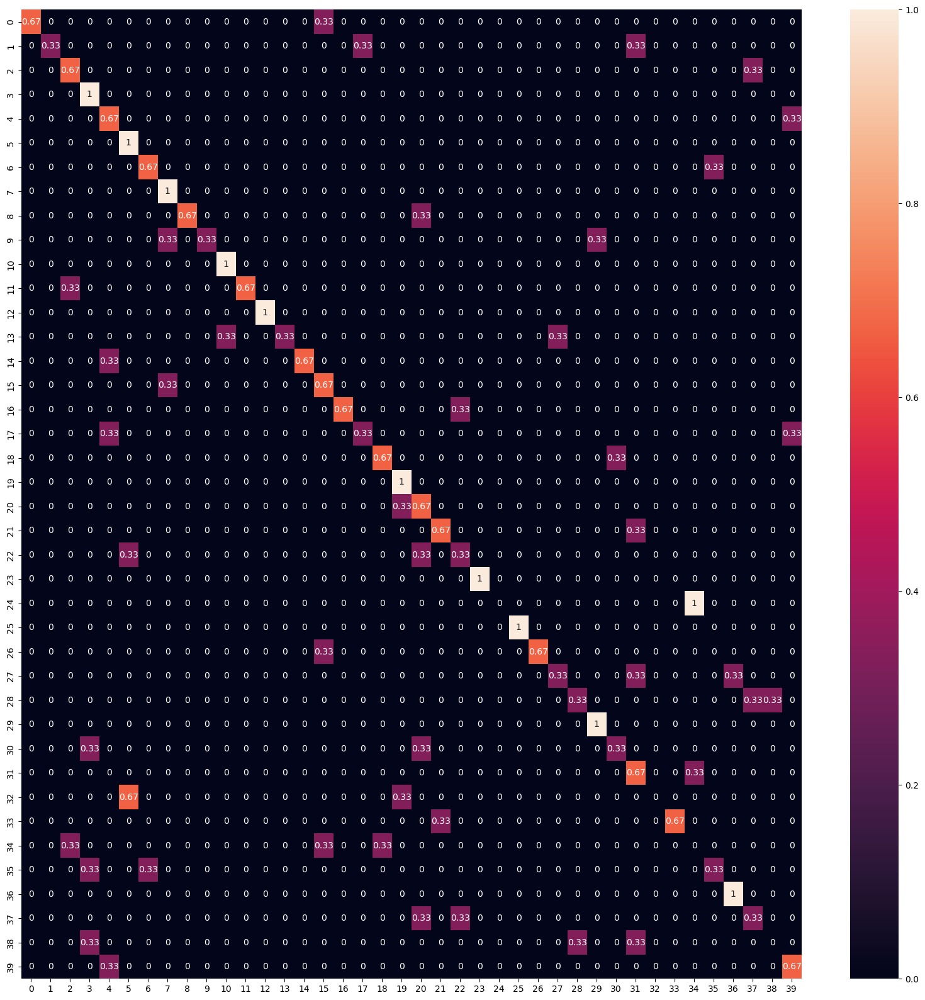

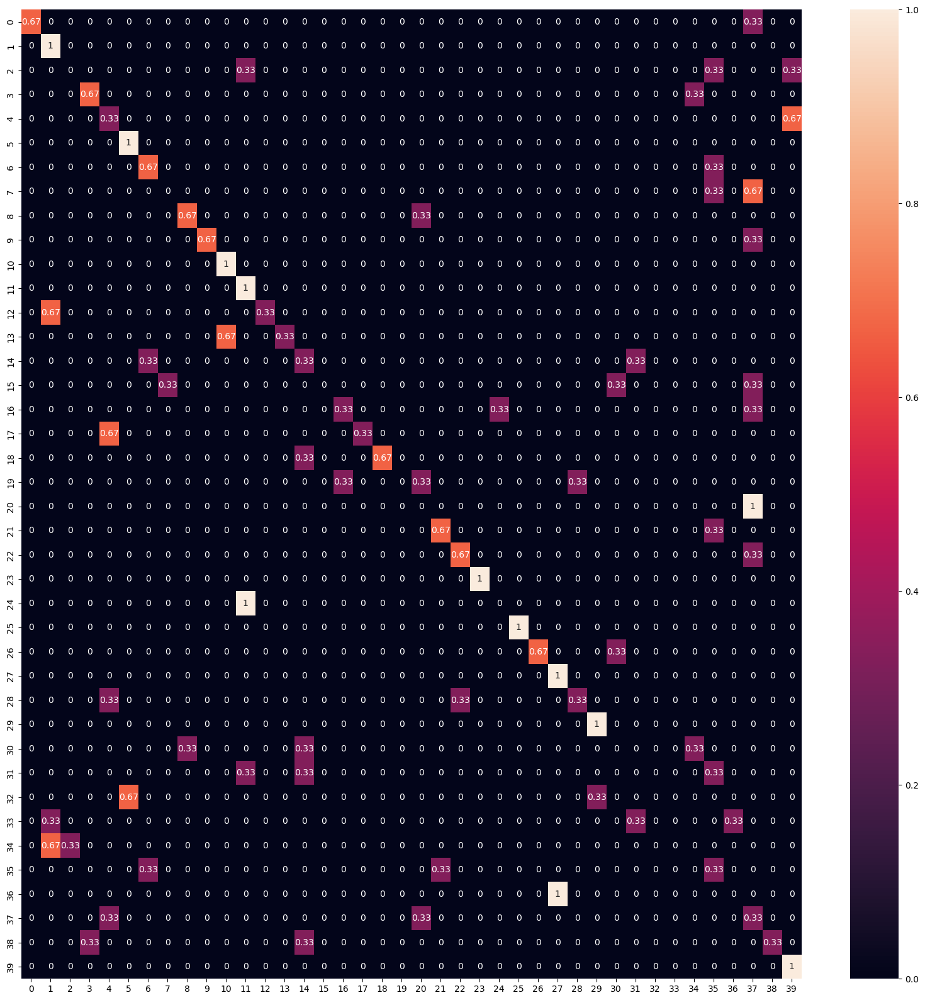

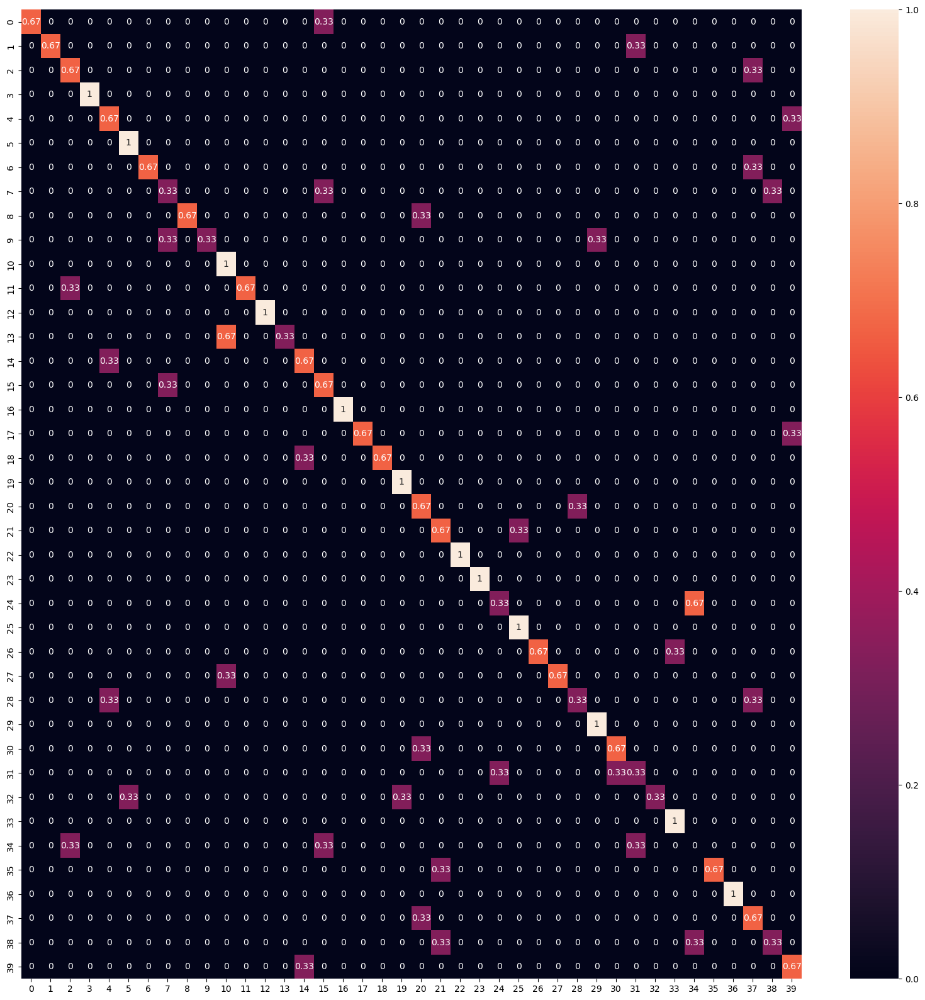

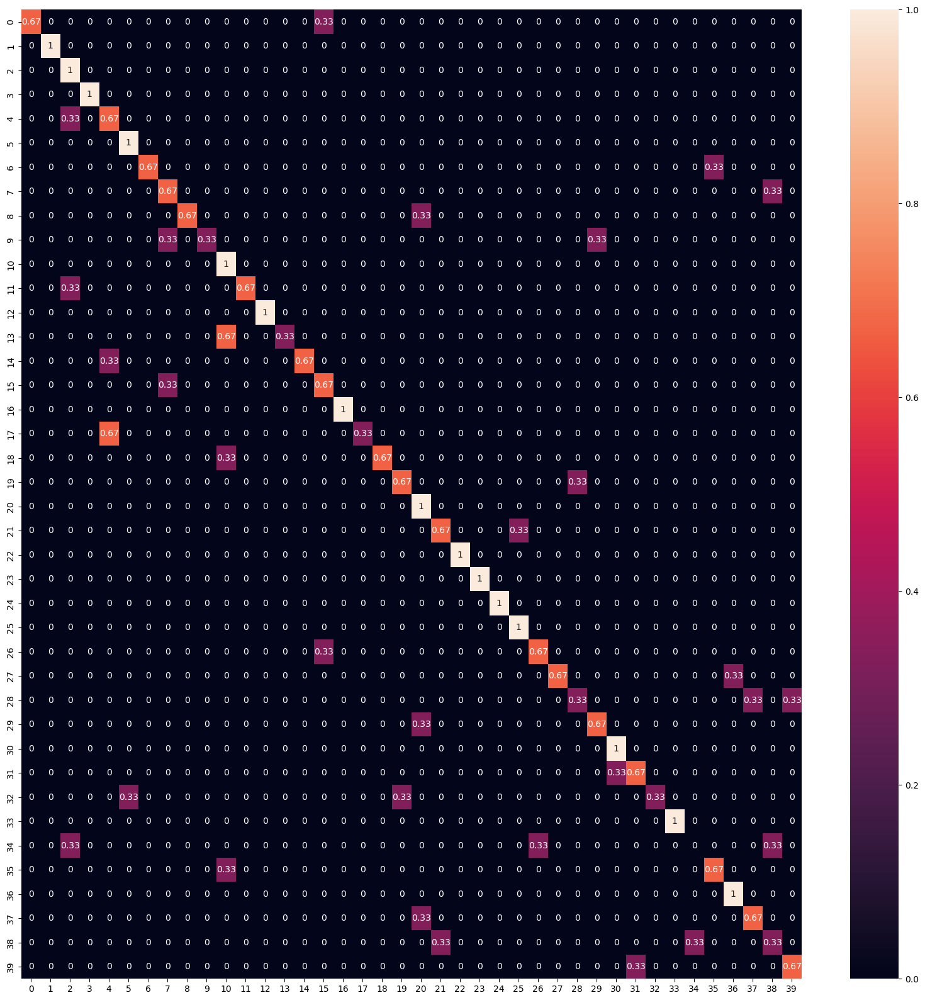

In [175]:
generate_confusion_matrix(prediction_mlp_1)
generate_confusion_matrix(prediction_mlp_2)
generate_confusion_matrix(prediction_mlp_3)
generate_confusion_matrix(prediction_mlp_4)
generate_confusion_matrix(prediction_mlp_5)
generate_confusion_matrix(prediction_mlp_6)
generate_confusion_matrix(prediction_mlp_7)
generate_confusion_matrix(prediction_mlp_8)
